<a href="https://colab.research.google.com/github/mrdbourke/zero-to-mastery-ml/blob/master/section-4-unstructured-data-projects/end-to-end-dog-vision-v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction to TensorFlow, Deep Learning and Transfer Learning (work in progress)

* **Project:** Dog Vision 🐶👁 - Using computer vision to classify dog photos into different breeds.
* **Goals:** Learn TensorFlow, deep learning and transfer learning.
* **Domain:** Computer vision.
* **Data:** Images of dogs from [Stanford Dogs Dataset](http://vision.stanford.edu/aditya86/ImageNetDogs/) (120 dog breeds, 20,000+ images).
* **Problem type:** Multi-class classification (120 different classes).

Welcome, welcome!

The focus of this notebook is to give a quick overview of deep learning with TensorFlow.

How?

We're going to go through the machine learning workflow steps and build a computer vision project to classify photos of dogs into their respective dog breed.

TK - image of workflow - e.g. dog photo -> model -> dog breed

In [ ]:
# Quick timestamp
import datetime
print(f"Last updated: {datetime.datetime.now()}")

Last updated: 2023-11-09 01:52:47.025946


## TK - What we're going to cover

In this project, we're going to be introduced to the power of deep learning and more specifically, transfer learning using TensorFlow.

We'll go through each of these in the context of the [6 step machine learning framework](https://dev.mrdbourke.com/zero-to-mastery-ml/a-6-step-framework-for-approaching-machine-learning-projects/):

1. **Problem defintion** - Use computer vision to classify photos of dogs into different dog breeds.
2. **Data** - 20,000+ images of dogs from 120 different dog breeds from the [Stanford Dogs dataset](http://vision.stanford.edu/aditya86/ImageNetDogs/).
3. **Evaluation** - We'd like to beat the original paper's results (22% mean accuracy across all classes, **tip:** A good way to practice your skills is to find some results online and try to beat them).
4. **Features** - Because we're using deep learning, our model will learn the features on its own.
5. **Modelling** - We're going to use a pretrained convolutional neural network (CNN) and transfer learning.
6. **Experiments** - We'll try different amounts of data with the same model to see the effects on our results.

> **Note:** It's okay not to know these exact steps ahead of time. When starting a new project, it's often the case you'll figure it out as you go. These steps are only filled out because I've had practice working on several machine learning projects. You'll pick up these ideas overtime.


## TK - Table of contents

* Problem type (e.g. multi-class classification)
* Domain (e.g. computer vision)
* Data type (e.g. unstructured vs structured)

# Problem Defintion





# Data



# Evaluation



# Features



# Modelling



# Experiments

## TK - Where can can you get help?

All of the materials for this course [live on GitHub](https://github.com/mrdbourke/zero-to-mastery-ml/tree/master).

If you run into trouble, you can ask a question on the course [GitHub Discussions page](https://github.com/mrdbourke/zero-to-mastery-ml/discussions) there too.

## Quick definitions

Let's start by breaking down some of the most important topics we're going to go through.

### TK - What is TensorFlow?

[TensorFlow](https://www.tensorflow.org/) is an open source machine learning and deep learning framework originally developed by Google.

### TK - Why use TensorFlow?

TensorFlow allows you to manipulate data and write deep learning algorithms using Python code.

It also has several built-in capabilities to leverage accelerated computing hardware (e.g. GPUs, Graphics Processing Units and TPUs, Tensor Processing Units).

Many of world's largest companies [power their machine learning workloads with TensorFlow](https://www.tensorflow.org/about/case-studies).

### TK - What is deep learning?

[Deep learning](https://en.wikipedia.org/wiki/Deep_learning) is a form of machine learning where data passes through a series of progressive layers which all contribute to learning an overall representation of that data.

The series of progressive layers combines to form what's referred to as a [**neural network**](https://en.wikipedia.org/wiki/Artificial_neural_network).

For example, a photo may be turned into numbers and those numbers are then manipulated mathematically through each progressive layer to learn patterns in the photo.

The "deep" in deep learning comes from the number of layers used in the neural network.

So when someone says deep learning or (artificial neural networks), they're typically referring to same thing.

### TK - What can deep learning be used for?

Deep learning is such a powerful technique that new use cases are being discovered everyday.

Most of the modern forms of artifical intelligence (AI) applications you see, are powered by deep learning.

[ChatGPT](https://chat.openai.com) uses deep learning to process text and return a response.

Tesla's [self-driving cars use deep learning](https://www.tesla.com/AI) to power their computer vision systems.

Apple's Photos app uses deep learning to [recognize faces in images](https://machinelearning.apple.com/research/recognizing-people-photos) and create Photo Memories.

[Nutrify](https://nutrify.app) (an app my brother and I build) uses deep learning to recognize food in images.

TK - image of examples

### TK - What is transfer learning?

[Transfer learning](https://en.wikipedia.org/wiki/Transfer_learning) is one of the most powerful and useful techniques in modern AI and machine learning.

It involves taking what one model (or neural network) has learned in a similar domain and applying to your own.

In our case, we're going to use transfer learning to take the patterns a neural network has learned from the 1 million+ images and over 1000 classes in [ImageNet](https://www.image-net.org/) (a gold standard computer vision benchmark) and apply them to our own problem of recognizing dog breeds.

The biggest benefit of transfer learning is that it often allows you to get outstanding results with less data and time.

TK - Transfer learning workflow - Large data -> Large model -> Patterns -> Custom data -> Custom model

## TK - Getting setup

This section of the course is taught with Google Colab, an online Jupyter Notebook that provides free access to GPUs (Graphics Processing Units, we'll hear more on these later).

For a quick rundown on how to use Google Colab, see their [introductory guide](https://colab.research.google.com/notebooks/basic_features_overview.ipynb) (it's quite similar to a Jupyter Notebook with a few different options).

Google Colab also comes with many data science and machine learning libraries, including TensorFlow, pre-installed.

### Getting a GPU

Before running any code, we'll make sure our Google Colab instance is connected to a GPU.

You can do this via going to Runtime -> Change runtime type -> GPU (this may restart your existing runtime).

Why use a GPU?

Since neural networks perform a large amount of calculations behind the scenes (the main one being matrix multiplication), you need a computer chip that perform these calculations quickly, otherwise you'll be waiting all day for a model to train.

And in short, GPUs are much faster at performing matrix multiplications than CPUs.

Why this is the case is behind the scope of this project (you can search "why are GPUs faster than CPUs for machine learning?" for more).

The main thing to remember is: generally, in deep learning, GPUs = faster than CPUs.

> **Note:** A good experiment would be to run the neural networks we're going to build later on with and without a GPU and see the difference in their training times.

Ok, enough talking, let's start by importing TensorFlow!

We'll do so using the common abbreviation `tf`.

In [ ]:
# TK - TODO: Check compatibility with Keras 3.0 by installing tf-nightly, see: https://x.com/fchollet/status/1719448117064659352?s=20
import tensorflow as tf
tf.__version__

'2.14.0'

Nice!

> **Note:** If you want to run TensorFlow locally, you can follow the [TensorFlow installation guide](https://www.tensorflow.org/install).

Now let's check to see if TensorFlow has access to a GPU (this isn't 100% required to complete this project but will speed things up dramatically).

We can do so with the method [`tf.config.list_physical_devices()`](https://www.tensorflow.org/api_docs/python/tf/config/list_physical_devices).

In [ ]:
# Do we have access to a GPU?
device_list = tf.config.list_physical_devices()
if "GPU" in [device.device_type for device in device_list]:
  print(f"[INFO] TensorFlow has GPU available to use. Woohoo!! Computing will be sped up!")
  print(f"[INFO] Accessible devices:\n{device_list}")
else:
  print(f"[INFO] TensorFlow does not have GPU available to use. Models may take a while to train.")
  print(f"[INFO] Accessible devices:\n{device_list}")

[INFO] TensorFlow has GPU available to use. Woohoo!! Computing will be sped up!
[INFO] Accessible devices:
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


# TK - Getting Data

There are several options and locations to get data for a deep learning project.

| Resource | Description |
|----------|-------------|
| [Kaggle Datasets](https://www.kaggle.com/datasets) | A collection of datasets across a wide range of topics. |
| [TensorFlow Datasets](https://www.tensorflow.org/datasets) | A collection of ready-to-use machine learning datasets ready for use under the `tf.data.Datasets` API. You can see a list of [all available datasets](https://www.tensorflow.org/datasets/catalog/overview#all_datasets) in the TensorFlow documentation. |
| [Hugging Face Datasets](https://huggingface.co/datasets) | A continually growing resource of datasets broken into several different kinds of topics. |
| [Google Dataset Search](https://datasetsearch.research.google.com/) | A search engine by Google specifically focused on searching online datasets. |
| Original sources | Datasets which are made available by researchers or companies with the release of a product or research paper (sources for these will vary, they could be a link on a website or a link to an application form). |
| Custom datasets | These are datasets comprised of your own custom source of data. You may build these from scratch on your own or have access to them from an existing product or service. For example, your entire photos library could be your own custom dataset or your entire notes and documents folder or your company's custom order history. |

In our case, the dataset we're going to use is called the Stanford Dogs dataset (or ImageNet dogs, as the images are dogs separated from ImageNet).

Because the Stanford Dogs dataset has been around for a while (since 2011, which as of writing this in 2023 is like a lifetime in deep learning), it's available from several resources:

* The [original project website](http://vision.stanford.edu/aditya86/ImageNetDogs/) via link download
* Inside [TensorFlow datasets under `stanford_dogs`](https://www.tensorflow.org/datasets/catalog/stanford_dogs)
* On [Kaggle as a downloadable dataset](https://www.kaggle.com/datasets/jessicali9530/stanford-dogs-dataset)

The point here is that when you're starting out with practicing deep learning projects, there's no shortage of datasets available.

However, when you start wanting to work on your own projects or within a company environment, you'll likely start to work on custom datasets (datasets you build yourself or aren't available publicly online).

The main difference between existing datasets and custom datasets is that existing datasets often come preformatted and ready to use.

Where as custom datasets often require some preprocessing before they're ready to use within a machine learning project.

To practice formatting a dataset for a machine learning problem, we're going to download the Stanford Dogs dataset from the original website.

Before we do so, the following code is an example of how we'd get the Stanford Dogs dataset from TensorFlow Datasets.

In [ ]:
# Download the dataset into train and test split using TensorFlow Datasets
# import tensorflow_datasets as tfds
# ds_train, ds_test = tfds.load('stanford_dogs', split=['train', 'test'])

### TK - Download data directly from Stanford Dogs website

Our overall project goal is to build a computer vision model which performs better than the original Stanford Dogs paper (average of 22% accuracy per class across 120 classes).

To do so, we need some data.

Let's download the original Stanford Dogs dataset from the project website.

The data comes in three main files:

1. [Images](http://vision.stanford.edu/aditya86/ImageNetDogs/images.tar) (757MB) - `images.tar`
3. [Annotations](http://vision.stanford.edu/aditya86/ImageNetDogs/annotation.tar) (21MB) - `annotation.tar`
3. [Lists](http://vision.stanford.edu/aditya86/ImageNetDogs/lists.tar), with train/test splits (0.5MB) - `lists.tar`

Our goal is to get a file structure like this:

```
dog_vision_data/
    images.tar
    annotation.tar
    lists.tar
```

> **Note:** If you're using Google Colab for this project, remember that any data uploaded to the Google Colab session gets deleted if the session disconnects. So to save us redownloading the data every time, we're going to download it once and save it to Google Drive.
>
> **Resource:** For a good guide on getting data in and out of Google Colab, see the [Google Colab `io.ipynb` tutorial](https://colab.research.google.com/notebooks/io.ipynb#scrollTo=RWSJpsyKqHjH).

To make sure we don't have to keep redownloading the data every time we leave and come back to Google Colab, we're going to:

1. Download the data if it doesn't already exist on Google Drive.
2. Copy it to Google Drive (because Google Colab connects nicely with Google Drive) if it isn't already there.
3. If the data already exists on Google Drive (we've been through steps 1 & 2), we'll import it instead.

There are two main options to connect Google Colab instances to Google Drive:

1. Click "Mount Drive" in "Files" menu on the left.
2. Mount programmatically with `from google.colab import drive` -> `drive.mount('/content/drive')`.

More specifically, we're going to follow the following steps:

1. Mount Google Drive.
2. Setup constants such as our base directory to save files to, the target files we'd like to download and target URL we'd like to download from.
3. Setup our target local path to save to.
4. Check if the target files all exist in Google Drive and if they do, copy them locally.
5. If the target files don't exist in Google Drive, download them from the target URL with the [`!wget`](https://www.gnu.org/software/wget/manual/wget.html) command.
6. Create a file on Google Drive to store the download files.
7. Copy the downloaded files to Google Drive for use later if needed.

A fair few steps, but nothing we can't handle!

Plus, this is all good practice for dealing with and manipulating data, a very important skill in the machine learning engineers toolbox.

In [ ]:
from pathlib import Path
from google.colab import drive

# 1. Mount Google Drive (this will bring up a pop-up to sign-in/authenticate)
# Note: This step is specifically for Google Colab, if you're working locally, you may need a different setup
drive.mount("/content/drive")

# 2. Setup constants
# Note: For constants like this, you'll often see them created as variables with all capitals
TARGET_DRIVE_PATH = Path("drive/MyDrive/tensorflow/dog_vision_data")
TARGET_FILES = ["images.tar", "annotation.tar", "lists.tar"]
TARGET_URL = "http://vision.stanford.edu/aditya86/ImageNetDogs"

# 3. Setup local path
local_dir = Path("dog_vision_data")

# 4. Check if the target files exist in Google Drive, if so, copy them to Google Colab
if all((TARGET_DRIVE_PATH / file).is_file() for file in TARGET_FILES):
  print(f"[INFO] Copying Dog Vision files from Google Drive to local directory...")
  print(f"[INFO] Source dir: {TARGET_DRIVE_PATH} -> Target dir: {local_dir}")
  !cp -r {TARGET_DRIVE_PATH} .
  print("[INFO] Good to go!")

else:
  # 5. If the files don't exist in Google Drive, download them
  print(f"[INFO] Target files not found in Google Drive.")
  print(f"[INFO] Downloading the target files... this shouldn't take too long...")
  for file in TARGET_FILES:
    # wget is short for "world wide web get", as in "get a file from the web"
    # -nc or --no-clobber = don't download files that already exist locally
    # -P = save the target file to a specified prefix, in our case, local_dir
    !wget -nc {TARGET_URL}/{file} -P {local_dir} # the "!" means to execute the command on the command line rather than in Python

  print(f"[INFO] Saving the target files to Google Drive, so they can be loaded later...")

  # 6. Ensure target directory in Google Drive exists
  TARGET_DRIVE_PATH.mkdir(parents=True, exist_ok=True)

  # 7. Copy downloaded files to Google Drive (so we can use them later and not have to re-download them)
  !cp -r {local_dir}/* {TARGET_DRIVE_PATH}/

Mounted at /content/drive
[INFO] Copying Dog Vision files from Google Drive to local directory...
[INFO] Source dir: drive/MyDrive/tensorflow/dog_vision_data -> Target dir: dog_vision_data
[INFO] Good to go!


Data downloaded!

Nice work!

Now if we get the contents of `local_dir` (`dog_vision_data`), what do we get?

We can first make sure it exists with [`Path.exists()`](https://docs.python.org/3/library/pathlib.html#pathlib.Path.exists) and then we can iterate through its contents with [`Path.iterdir()`](https://docs.python.org/3/library/pathlib.html#pathlib.Path.iterdir) and print out the [`.name`](https://docs.python.org/3/library/pathlib.html#pathlib.PurePath.name) attribute of each file.

In [ ]:
if local_dir.exists():
  print(str(local_dir) + "/")
  for item in local_dir.iterdir():
    print("  ", item.name)

dog_vision_data/
   annotation.tar
   images.tar
   lists.tar


Excellent! That's exactly the format we wanted.

Now you might've noticed that each file ends in `.tar`.

What's this?

Searching "what is .tar?", I found:

> *In computing, tar is a computer software utility for collecting many files into one archive file, often referred to as a tarball, for distribution or backup purposes.*
>
> Source: [Wikipedia tar page](https://en.wikipedia.org/wiki/Tar_(computing)).

Exploring a bit more, I found that the `.tar` format is similar to `.zip`, however, `.zip` offers compression, where as `.tar` mostly combines many files into one.

So how do we "untar" the files in `images.tar`, `annotation.tar` and `lists.tar`?

We can use the [`!tar`](https://www.gnu.org/software/tar/manual/tar.html) command (or just `tar` from outside of a Jupyter Cell)!

Doing this will expand all of the files within each of the `.tar` archives.

We'll also use a couple of flags to help us out:
* The `-x` flag tells `tar` to extract files from an archive.
* The `-f` flag specifies that the following argument is the name of the archive file.
* You can combine flags by putting them together `-xf`.

Let's try it out!

In [ ]:
# Untar images
# -x = extract files from the zipped file
# -v = verbose
# -z = decompress files
# -f = tell tar which file to deal with
!tar -xf dog_vision_data/images.tar
!tar -xf dog_vision_data/annotation.tar
!tar -xf dog_vision_data/lists.tar

What new files did we get?

We can check in Google Colab by inspecting the "Files" tab on the left.

Or with Python by using [`os.listdir(".")`](https://docs.python.org/3/library/os.html#os.listdir) where `"."` means "the current directory".

In [ ]:
import os

os.listdir(".") # "." stands for "here" or "current directory"

['.config',
 'test_list.mat',
 'dog_vision_data',
 'Annotation',
 'train_list.mat',
 'drive',
 'Images',
 'file_list.mat',
 'sample_data']

Ooooh!

Looks like we've got some new files!

Specifically:

* `train_list.mat` - a list of all the training set images.
* `test_list.mat` - a list of all the testing set images.
* `Images/` - a folder containing all of the images of dogs.
* `Annotation/` - a folder containing all of the annotations for each image.
* `file_list.mat` - a list of all the files (training and test list combined).

Our next step is to go through them and see what we've got.



## Exploring the data

Once you've got a dataset, before building a model, it's wise to explore it for a bit to see what kind of data you're working with.

* TK - things you should do when you start with a new dataset
* visualize
* check the distributions (e.g. number of samples per class)

TK - daniel bourke tweet about abraham loss function - https://twitter.com/mrdbourke/status/1456087631641473033

### Discussing our target data format

Since our goal is to build a computer vision model to classify dog breeds, we need a way to tell our model what breed of dog is in what image.

A common data format for a classification problem is to have samples stored in folders named after their class name.

For example:

```
images_split/
├── train/
│   ├── class_1/
│   │   ├── train_image1.jpg
│   │   ├── train_image2.jpg
│   │   └── ...
│   ├── class_2/
│   │   ├── train_image1.jpg
│   │   ├── train_image2.jpg
│   │   └── ...
└── test/
    ├── class_1/
    │   ├── test_image1.jpg
    │   ├── test_image2.jpg
    │   └── ...
    ├── class_2/
    │   ├── test_image1.jpg
    │   ├── test_image2.jpg
...
```

In the case of dog images, we'd put all of the images labelled "chihuahua" in a folder called `chihuahua/` (and so on for all the other classes and images).

We could split these folders so that training images go in `train/chihuahua/` and testing images go in `test/chihuahua/`.

This is what we'll be working towards creating.

> **Note:** This structure of folder format doesn't just work for only images, it works for text, audio and other kind of classification data too.



### Exploring the file lists

How about we check out the `train_list.mat`, `test_list.mat` and `full_list.mat` files?

Searching online, for "what is a .mat file?", I found that [it's a MATLAB file](https://www.mathworks.com/help/matlab/import_export/mat-file-versions.html). Before Python became the default language for machine learning and deep learning, many models and datasets were built in MATLAB.

Then I searched, "how to open a .mat file with Python?" and found an [answer on Stack Overflow](https://stackoverflow.com/questions/874461/read-mat-files-in-python) saying I could use the [`scipy` library](https://scipy.org/) (a scientific computing library).

The good news is, Google Colab comes with `scipy` preinstalled.

We can use the [`scipy.io.loadmat()`](https://docs.scipy.org/doc/scipy/reference/generated/scipy.io.loadmat.html) method to open a `.mat` file.

In [ ]:
import scipy

# Open lists of train and test .mat
train_list = scipy.io.loadmat("train_list.mat")
test_list = scipy.io.loadmat("test_list.mat")
file_list = scipy.io.loadmat("file_list.mat")

# Let's inspect the output and type of the train_list
train_list, type(train_list)

({'__header__': b'MATLAB 5.0 MAT-file, Platform: GLNXA64, Created on: Sun Oct  9 08:36:13 2011',
  '__version__': '1.0',
  '__globals__': [],
  'file_list': array([[array(['n02085620-Chihuahua/n02085620_5927.jpg'], dtype='<U38')],
         [array(['n02085620-Chihuahua/n02085620_4441.jpg'], dtype='<U38')],
         [array(['n02085620-Chihuahua/n02085620_1502.jpg'], dtype='<U38')],
         ...,
         [array(['n02116738-African_hunting_dog/n02116738_6754.jpg'], dtype='<U48')],
         [array(['n02116738-African_hunting_dog/n02116738_9333.jpg'], dtype='<U48')],
         [array(['n02116738-African_hunting_dog/n02116738_2503.jpg'], dtype='<U48')]],
        dtype=object),
  'annotation_list': array([[array(['n02085620-Chihuahua/n02085620_5927'], dtype='<U34')],
         [array(['n02085620-Chihuahua/n02085620_4441'], dtype='<U34')],
         [array(['n02085620-Chihuahua/n02085620_1502'], dtype='<U34')],
         ...,
         [array(['n02116738-African_hunting_dog/n02116738_6754'], dtype=

Okay, looks like we get a dictionary with several fields we may be interested in.

Let's check out the keys of the dictionary.

In [ ]:
train_list.keys()

dict_keys(['__header__', '__version__', '__globals__', 'file_list', 'annotation_list', 'labels'])

My guess is that the `file_list` key is what we're after, as this looks like a large array of image names (the files all end in `.jpg`).

How about we see how many files are in each `file_list` key?

In [ ]:
# Check the length of the file_list key
print(f"Number of files in training list: {len(train_list['file_list'])}")
print(f"Number of files in testing list: {len(test_list['file_list'])}")
print(f"Number of files in full list: {len(file_list['file_list'])}")

Number of files in training list: 12000
Number of files in testing list: 8580
Number of files in full list: 20580


Beautiful! Looks like these lists contain our training and test splits and the full list has a list of all the files in the dataset.

Let's inspect the `train_list['file_list']` further.

In [ ]:
train_list['file_list']

array([[array(['n02085620-Chihuahua/n02085620_5927.jpg'], dtype='<U38')],
       [array(['n02085620-Chihuahua/n02085620_4441.jpg'], dtype='<U38')],
       [array(['n02085620-Chihuahua/n02085620_1502.jpg'], dtype='<U38')],
       ...,
       [array(['n02116738-African_hunting_dog/n02116738_6754.jpg'], dtype='<U48')],
       [array(['n02116738-African_hunting_dog/n02116738_9333.jpg'], dtype='<U48')],
       [array(['n02116738-African_hunting_dog/n02116738_2503.jpg'], dtype='<U48')]],
      dtype=object)

Looks like we've got an array of arrays.

How about we turn them into a Python list for easier handling?

We can do so by extracting each individual item via indexing and list comprehension.

Let's see what it's like to get a single file name.

In [ ]:
# Get a single filename
train_list['file_list'][0][0][0]

'n02085620-Chihuahua/n02085620_5927.jpg'

Now let's get a Python list of all the individual file names (e.g. `n02097130-giant_schnauzer/n02097130_2866.jpg`) so we can use them later.

In [ ]:
# Get a Python list of all file names for each list
train_file_list = list([item[0][0] for item in train_list["file_list"]])
test_file_list = list([item[0][0] for item in test_list["file_list"]])
full_file_list = list([item[0][0] for item in file_list["file_list"]])

len(train_file_list), len(test_file_list), len(full_file_list)

(12000, 8580, 20580)

Wonderful!

How about we view a random sample of the filenames we extracted?

> **Note:** One of my favourite things to do whilst exploring data is to continually view random samples of it. Whether it be file names or images or text snippets. Why? You can always view the first X number of samples, however, I find that continually viewing random samples of the data gives you a better of overview of the different kinds of data you're working with. It also gives you the small chance of stumbling upon a potential error.

We can view random samples of the data using Python's [`random.sample()`](https://docs.python.org/3/library/random.html#random.sample) method.

In [ ]:
import random

random.sample(train_file_list, k=10)

['n02113712-miniature_poodle/n02113712_578.jpg',
 'n02109047-Great_Dane/n02109047_6008.jpg',
 'n02106030-collie/n02106030_10246.jpg',
 'n02098413-Lhasa/n02098413_2308.jpg',
 'n02085620-Chihuahua/n02085620_9414.jpg',
 'n02109047-Great_Dane/n02109047_2475.jpg',
 'n02102318-cocker_spaniel/n02102318_8482.jpg',
 'n02091244-Ibizan_hound/n02091244_2050.jpg',
 'n02093754-Border_terrier/n02093754_1845.jpg',
 'n02106382-Bouvier_des_Flandres/n02106382_501.jpg']

Now let's do a quick check to make sure none of the training image file names appear in the testing image file names list.

This is important because the number 1 rule in machine learning is: **always keep the test set separate from the training set**.

We can check that there are no overlaps by turning `train_file_list` into a Python [`set()`](https://docs.python.org/3/library/stdtypes.html#set-types-set-frozenset) and using the [`intersection()`](https://docs.python.org/3/library/stdtypes.html#frozenset.intersection) method.

In [ ]:
# How many files in the training set intersect with the testing set?
len(set(train_file_list).intersection(test_file_list))

0

Excellent! Looks like there are no overlaps.

We could even put an [`assert`](https://docs.python.org/3/reference/simple_stmts.html#the-assert-statement) check to raise an error if there are any overlaps (e.g. the length of the intersection is greater than 0).

`assert` works in the fashion: `assert expression, message_if_expression_fails`.

If the `assert` check doesn't output anything, we're good to go!

In [ ]:
# Make an assertion statement to check there are no overlaps (try changing test_file_list to train_file_list to see how it works)
assert len(set(train_file_list).intersection(test_file_list)) == 0, "There are overlaps between the training and test set files, please check them."

Woohoo!

Looks like there's no overlaps, let's keep exploring the data.

### Exploring the Annotation folder

How about we look at the `Annotation` folder next?

We can click the folder on the file explorer on the left to see what's inside.

But we can also explore the contents of the folder with Python.

Let's use [`os.listdir()`](https://docs.python.org/3/library/os.html#os.listdir) to see what's inside.

In [ ]:
os.listdir("Annotation")[:10]

['n02086240-Shih-Tzu',
 'n02113978-Mexican_hairless',
 'n02086646-Blenheim_spaniel',
 'n02108089-boxer',
 'n02107908-Appenzeller',
 'n02105251-briard',
 'n02097474-Tibetan_terrier',
 'n02097209-standard_schnauzer',
 'n02089973-English_foxhound',
 'n02109525-Saint_Bernard']

Looks like there are files each with a dog breed name with several numbered files inside.

Each of the files contains a HTML version of an annotation relating to an image.

For example, `Annotation/n02085620-Chihuahua/n02085620_10074`:

```
<annotation>
	<folder>02085620</folder>
	<filename>n02085620_10074</filename>
	<source>
		<database>ImageNet database</database>
	</source>
	<size>
		<width>333</width>
		<height>500</height>
		<depth>3</depth>
	</size>
	<segment>0</segment>
	<object>
		<name>Chihuahua</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>25</xmin>
			<ymin>10</ymin>
			<xmax>276</xmax>
			<ymax>498</ymax>
		</bndbox>
	</object>
</annotation>
```

The fields include the name of the image, the size of the image, the label of the object and where it is (bounding box coordinates).

If we were performing [object detection](https://en.wikipedia.org/wiki/Object_detection) (finding the location of a thing in an image), we'd pay attention to the `<bndbox>` coordinates.

However, since we're focused on classification, our main consideration is the mapping of image name to class name.

Since we're dealing with 120 classes of dog breed, let's write a function to check the number of subfolders in the `Annotation` directory (there should be 120 subfolders, one for each breed of dog).

To do so, we can use Python's [`pathlib.Path` class](https://docs.python.org/3/library/pathlib.html#basic-use), along with [`Path.iterdir()`](https://docs.python.org/3/library/pathlib.html#pathlib.Path.iterdir) to loop over the contents of `Annotation` and [`Path.is_dir()`](https://docs.python.org/3/library/pathlib.html#pathlib.Path.is_dir) to check if the target item is a directory.

In [ ]:
from pathlib import Path

def count_subfolders(directory_path: str) -> int:
    """
    Count the number of subfolders in a given directory.

    Args:
    directory_path (str): The path to the directory in which to count subfolders.

    Returns:
    int: The number of subfolders in the specified directory.

    Examples:
    >>> count_subfolders('/path/to/directory')
    3  # if there are 3 subfolders in the specified directory
    """
    return len([name for name in Path(directory_path).iterdir() if name.is_dir()])


directory_path = "Annotation"
folder_count = count_subfolders(directory_path)
print(f"Number of subfolders in {directory_path} directory: {folder_count}")

Number of subfolders in Annotation directory: 120


Perfect!

There are 120 subfolders of annotations, one for each class of dog we'd like to identify.

But on further inspection of our file lists, it looks like the class name is already in the filepath.

In [ ]:
# View a single training file pathname
train_file_list[0]

'n02085620-Chihuahua/n02085620_5927.jpg'

With this information we know, that image `n02085620_5927.jpg` should contain a `Chihuahua`.

Let's check.

I searched "how to display an image in Google Colab" and found another [answer on Stack Overflow](https://stackoverflow.com/questions/49478791/how-can-i-open-images-in-a-google-colaboratory-notebook-cell-from-uploaded-png-f).

Turns out you can use [`IPython.display.Image()`](https://ipython.readthedocs.io/en/stable/api/generated/IPython.display.html#IPython.display.Image), as Google Colab comes with IPython (Interactive Python) built-in.

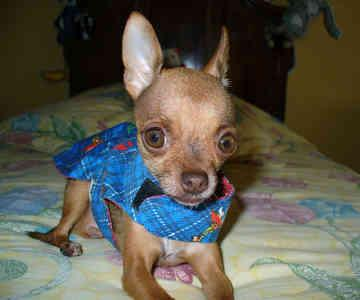

In [ ]:
from IPython.display import Image
Image(Path("Images", train_file_list[0]))

Woah!

We get an image of a dog!

## Exploring the Images folder

We've explored the `Annotations` folder, now let's check out our `Images` folder.

We know that the image file names come in the format `class_name/image_name`, for example, `n02085620-Chihuahua/n02085620_5927.jpg`.

To make things a little simpler, let's create the following:

1. A mapping from folder name -> class name in dictionary form, for example, `{'n02113712-miniature_poodle': 'miniature_poodle',
 'n02092339-Weimaraner': 'weimaraner',
 'n02093991-Irish_terrier': 'irish_terrier'...}`. This will help us when visualizing our data from its original folder.
2. A list of all unique dog class names with simple formatting, for example, `['affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier'...]`.

 Let's start by getting a list of all the folders in the `Images` directory with `os.listdir()`.

In [ ]:
# Get a list of all image folders
image_folders = os.listdir("Images")
image_folders[:10]

['n02086240-Shih-Tzu',
 'n02113978-Mexican_hairless',
 'n02086646-Blenheim_spaniel',
 'n02108089-boxer',
 'n02107908-Appenzeller',
 'n02105251-briard',
 'n02097474-Tibetan_terrier',
 'n02097209-standard_schnauzer',
 'n02089973-English_foxhound',
 'n02109525-Saint_Bernard']

Excellent!

Now let's make a dictionary which maps from the folder name to a simplified version of the class name, for example:

```
{'n02085782-Japanese_spaniel': 'japanese_spaniel',
'n02106662-German_shepherd': 'german_shepherd',
'n02093256-Staffordshire_bullterrier': 'staffordshire_bullterrier',
...}
```


In [ ]:
# Create folder name -> class name dict
folder_to_class_name_dict = {}
for folder_name in image_folders:
  # Turn folder name into class_name
  # E.g. "n02089078-black-and-tan_coonhound" -> "black_and_tan_coonhound"
  # We'll split on the first "-" and join the rest of the string with "_" and then lower it
  class_name = "_".join(folder_name.split("-")[1:]).lower()
  folder_to_class_name_dict[folder_name] = class_name

# Make sure there are 120 entries in the dictionary
assert len(folder_to_class_name_dict) == 120

Folder name to class name mapping created, let's view the first 10.

In [ ]:
sorted(folder_to_class_name_dict.items())[:10]

[('n02085620-Chihuahua', 'chihuahua'),
 ('n02085782-Japanese_spaniel', 'japanese_spaniel'),
 ('n02085936-Maltese_dog', 'maltese_dog'),
 ('n02086079-Pekinese', 'pekinese'),
 ('n02086240-Shih-Tzu', 'shih_tzu'),
 ('n02086646-Blenheim_spaniel', 'blenheim_spaniel'),
 ('n02086910-papillon', 'papillon'),
 ('n02087046-toy_terrier', 'toy_terrier'),
 ('n02087394-Rhodesian_ridgeback', 'rhodesian_ridgeback'),
 ('n02088094-Afghan_hound', 'afghan_hound')]

And we can get a list of unique dog names by getting the `values()` of the `folder_to_class_name_dict` and turning it into a list.

In [ ]:
dog_names = sorted(list(folder_to_class_name_dict.values()))
dog_names[:10]

['affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle']

Perfect!

Now we've got:

1. `folder_to_class_name_dict` - a mapping from the folder name to the class name.
2. `dog_names` - a list of all the unique dog breeds we're working with.



### Visualize a group of random images

How about we follow the data explorers motto of *visualize, visualize, visualize* and view some random images?

To help us visualize, let's create a function that takes in a list of image paths and then randomly selects 10 of those paths to display.

The function will:
1. Take in a select list of image paths.
2. Create a grid of matplotlib plots (e.g. 2x5 = 10 plots to plot on).
3. Randomly sample 10 image paths from the input image path list (using `random.sample()`).
4. Iterate through the flattened axes via `axes.flat` which is a reference to the attribute [`numpy.ndarray.flat`](https://numpy.org/doc/stable/reference/generated/numpy.ndarray.flat.html).
5. Extract the sample path from the list of samples.
6. Get the sample title from the parent folder of the path using [`Path.parent.stem`](https://docs.python.org/3/library/pathlib.html#pathlib.PurePath.parent) and then extract the formatted dog breed name by indexing `folder_to_class_name_dict`.
7. Read the image with [`plt.imread()`](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.imread.html) and show it on the target `ax` with [`ax.imshow()`](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.imshow.html).
8. Set the title of the plot to the parent folder name with [`ax.set_title()`](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.set_title.html) and turn the axis marks of with [`ax.axis("off")`](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.axis.html) (this makes for pretty plots).
9. Show the plot with `plt.show()`.

Woah!

A lot of steps! But nothing we can't handle, let's do it.

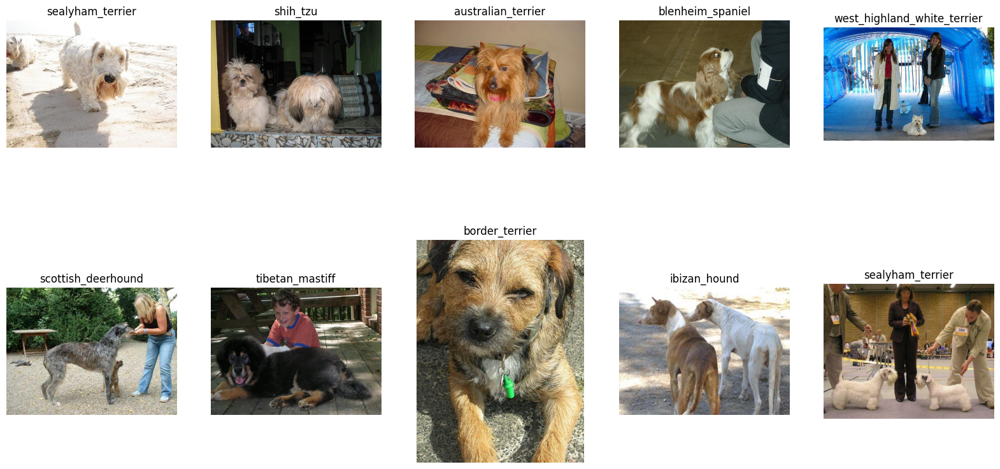

In [ ]:
from typing import List
from pathlib import Path
import matplotlib.pyplot as plt
import random

# 1. Take in a select list of image paths
def plot_10_random_images_from_path_list(path_list: List[Path],
                                         extract_title=True) -> None:
  # 2. Set up a grid of plots
  fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 10))

  # 3. Randomly sample 10 paths from the list
  samples = random.sample(path_list, 10)

  # 4. Iterate through the flattened axes and corresponding sample paths
  for i, ax in enumerate(axes.flat):

    # 5. Get the target sample path (e.g. "Images/n02087394-Rhodesian_ridgeback/n02087394_1161.jpg")
    sample_path = samples[i]

    # 6. Extract the parent directory name to use as the title (if necessary)
    # (e.g. n02087394-Rhodesian_ridgeback/n02087394_1161.jpg -> n02087394-Rhodesian_ridgeback -> rhodesian_ridgeback)
    if extract_title:
      sample_title = folder_to_class_name_dict[sample_path.parent.stem]
    else:
      sample_title = sample_path.parent.stem

    # 7. Read the image file and plot it on the corresponding axis
    ax.imshow(plt.imread(sample_path))

    # 8. Set the title of the axis and turn of the axis (for pretty plots)
    ax.set_title(sample_title)
    ax.axis("off")

  # 9. Display the plot
  plt.show()

plot_10_random_images_from_path_list(path_list=[Path("Images") / Path(file) for file in train_file_list])

Those are some nice looking dogs!

What I like to do here is rerun the random visualizations until I've seen 100+ samples so I've got an idea of the data we're working with.

> **Question:** Here's something to think about, how would you code a system to differentiate between all the different breeds of dogs? Perhaps you write an algorithm to look at the shapes or the colours? You might be thinking "that would take quite a long time..." And you'd be right. Then how would we do it? Machine learning of course!

### Exploring the distribution of our data

After visualization, another valuable way to explore the data is by checking the data distribution.

Distribution refers to the "spread" of data.

In our case, how many images of dogs do we have per breed?

A balanced distribution would mean having roughly the same number of images for each breed (e.g. 100 images per dog breed).

> **Note:** There's a deeper level of distribution than just images per dog breed. Ideally, the images for each different breed are well distributed as well. For example, we wouldn't want to have 100 of the same image per dog breed. Not only would we like a similar number of images per breed, we'd like the images of each particular breed to be in different scenarios, different lighting, different angles. We want this because we want to our model to be able to recognize the correct dog breed no matter what angle the photo is taken from.

To figure out how many images we have per class, let's write a function count the number of images per subfolder in a given directory.

Specifically, we'll want the function to:
1. Take in a target directory/folder.
2. Create a list of all the subdirectories/subfolders in the target folder.
3. Create an empty list, `image_class_counts` to append subfolders and their counts to.
4. Iterate through all of the subdirectories.
5. Get the class name of the target folder as the name of the folder.
6. Count the number of images in the target folder using the length of the list of image paths (we can get these with [`Path().rglob(*.jpg)`](https://docs.python.org/3/library/pathlib.html#pathlib.Path.rglob) where `*.jpg` means "all files with the extension `.jpg`.
7. Append a dictionary of `{"class_name": class_name, "image_count": image_count}` to the `image_class_counts` list (we create a list of dictionaries so we can turn this into a pandas DataFrame).
8. Return the `image_class_counts` list.

In [ ]:
# Create a dictionary of image counts
from pathlib import Path
from typing import List, Dict

# 1. Take in a target directory
def count_images_in_subdirs(target_directory: str) -> List[Dict[str, int]]:
    """
    Counts the number of JPEG images in each subdirectory of the given directory.

    Each subdirectory is assumed to represent a class, and the function counts
    the number of '.jpg' files within each one. The result is a list of
    dictionaries with the class name and corresponding image count.

    Args:
        target_directory (str): The path to the directory containing subdirectories.

    Returns:
        List[Dict[str, int]]: A list of dictionaries with 'class_name' and 'image_count' for each subdirectory.

    Examples:
        >>> count_images_in_subdirs('/path/to/directory')
        [{'class_name': 'beagle', 'image_count': 50}, {'class_name': 'poodle', 'image_count': 60}]
    """
    # 2. Create a list of all the subdirectoires in the target directory (these contain our images)
    images_dir = Path(target_directory)
    image_class_dirs = [directory for directory in images_dir.iterdir() if directory.is_dir()]

    # 3. Create an empty list to append image counts to
    image_class_counts = []

    # 4. Iterate through all of the subdirectories
    for image_class_dir in image_class_dirs:

        # 5. Get the class name from image directory (e.g. "Images/n02116738-African_hunting_dog" -> "n02116738-African_hunting_dog")
        class_name = image_class_dir.stem

        # 6. Count the number of images in the target subdirectory
        image_count = len(list(image_class_dir.rglob("*.jpg")))  # get length all files with .jpg file extension

        # 7. Append a dictionary of class name and image count to count list
        image_class_counts.append({"class_name": class_name,
                                   "image_count": image_count})

    # 8. Return the list
    return image_class_counts

Ho ho, what a function!

Let's run it on our target directory `Images` and view the first few indexes.

In [ ]:
image_class_counts = count_images_in_subdirs("Images")
image_class_counts[:3]

[{'class_name': 'n02086240-Shih-Tzu', 'image_count': 214},
 {'class_name': 'n02113978-Mexican_hairless', 'image_count': 155},
 {'class_name': 'n02086646-Blenheim_spaniel', 'image_count': 188}]

Nice!

Since our `image_class_counts` variable is the form of a list of dictionaries, we can turn it into a pandas `DataFrame`.

Let's sort the `DataFrame` by `"image_count"` so the classes with the most images appear at the top, we can do so with [`DataFrame.sort_values()`](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.sort_values.html).

In [ ]:
# Create a DataFrame
import pandas as pd
image_counts_df = pd.DataFrame(image_class_counts).sort_values(by="image_count", ascending=False)
image_counts_df.head()

,class_name,image_count
71,n02085936-Maltese_dog,252
32,n02088094-Afghan_hound,239
91,n02092002-Scottish_deerhound,232
117,n02112018-Pomeranian,219
35,n02107683-Bernese_mountain_dog,218


And let's cleanup the `"class_name"` column to be more readable by mapping the the values to our `folder_to_class_name_dict`.

In [ ]:
# Make class name column easier to read
image_counts_df["class_name"] = image_counts_df["class_name"].map(folder_to_class_name_dict)
image_counts_df.head()

,class_name,image_count
71,maltese_dog,252
32,afghan_hound,239
91,scottish_deerhound,232
117,pomeranian,219
35,bernese_mountain_dog,218


Now we've got a `DataFrame` of image counts per class, we can make them more visual by turning them into a plot.

We covered plotting data directly from pandas `DataFrame`'s in [*Section 3 of the Introduction to Matplotlib notebook: Plotting data directly with pandas*](https://dev.mrdbourke.com/zero-to-mastery-ml/introduction-to-matplotlib/#3-plotting-data-directly-with-pandas).

To do so, we can use `image_counts_df.plot(kind="bar", ...)` along with some other customization.

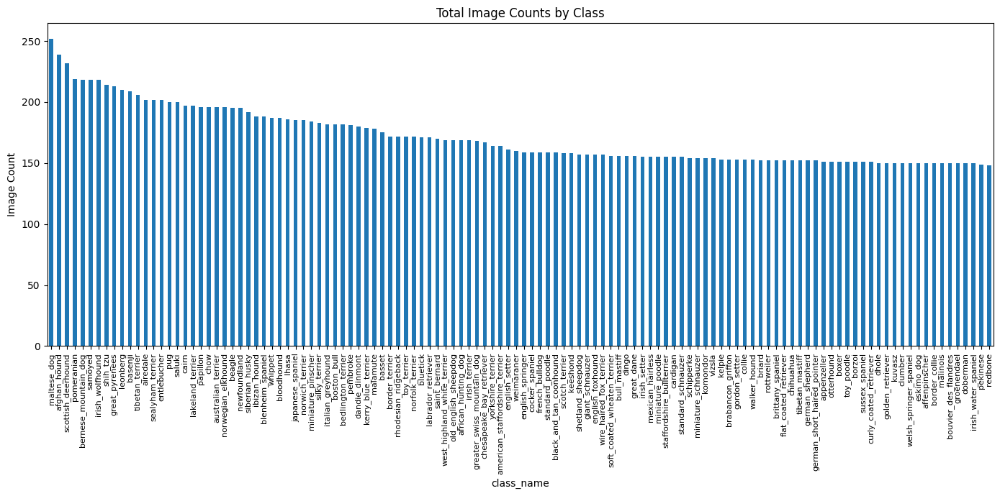

In [ ]:
# Turn the image counts DataFrame into a graph
import matplotlib.pyplot as plt
plt.figure(figsize=(14, 7))
image_counts_df.plot(kind="bar",
                     x="class_name",
                     y="image_count",
                     legend=False,
                     ax=plt.gca()) # plt.gca() = "get current axis", get the plt we setup above and put the data there

# Add customization
plt.ylabel("Image Count")
plt.title("Total Image Counts by Class")
plt.xticks(rotation=90, # Rotate the x labels for better visibility
           fontsize=8) # Make the font size smaller for easier reading
plt.tight_layout() # Ensure things fit nicely
plt.show()

Beautiful! It looks like our classes are quite balanced. Each breed of dog has ~150 or more images.

We can find out some other quick stats about our data with [`DataFrame.describe()`](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.describe.html).

In [ ]:
# Get various statistics about our data distribution
image_counts_df.describe()

,image_count
count,120.000000
mean,171.500000
std,23.220898
min,148.000000
25%,152.750000
50%,159.500000
75%,186.250000
max,252.000000


And the table shows a similar story to the plot. We can see the minimum number of images per class is 148, where as the maximum number of images is 252.

If one class had 10x less images than another class, we may look into collecting more data to improve the balance.

The main takeaway(s):
* When working on a classification problem, ideally, all classes have a similar number of samples (however, in some problems this may be unattainable, such as fraud detection, where you may have 1000x more "not fraud" samples to "fraud" samples.
* If you wanted to add a new class of dog breed to the existing 120, ideally, you'd have at least ~150 images for it.

## TK - Creating training and test data split directories

After exploring the data, one of the next best things you can do is create experimental data splits.

This includes:

| Set Name                 | Description                                          | Typical Percentage of Data |
|--------------------------|------------------------------------------------------|---------------------------|
| Training Set             | A dataset for the model to learn on                  | 70-80%                    |
| Testing Set              | A dataset for the model to be evaluated on           | 20-30%                    |
| (Optional) Validation Set | A dataset to tune the model on                       | 50% of the test data      |
| (Optional) Smaller Training Set | A smaller size dataset to run quick experiments on | 5-20% of the training set |

Our dog dataset already comes with specified training and test set splits.

So we'll stick with those.

But we'll also create a smaller training set (a random 10% of the training data) so we can stick to the machine learning engineers motto of *experiment, experiment, experiment!* and run quicker experiments.

> **Note:** One of the most important things in machine learning is being able to experiment quickly. As in, try a new model, try a new set of hyperparameters or try a new training setup. When you start out, you want the time between your experiments to be as small as possible so you can quickly figure out what *doesn't work* so you can spend more time on and run larger experiments with what *does* work.

As previously discussed, we're working towards a directory structure of:

```
images_split/
├── train/
│   ├── class_1/
│   │   ├── train_image1.jpg
│   │   ├── train_image2.jpg
│   │   └── ...
│   ├── class_2/
│   │   ├── train_image1.jpg
│   │   ├── train_image2.jpg
│   │   └── ...
└── test/
    ├── class_1/
    │   ├── test_image1.jpg
    │   ├── test_image2.jpg
    │   └── ...
    ├── class_2/
    │   ├── test_image1.jpg
    │   ├── test_image2.jpg
...
```

So let's write some code to create:
* `images/train/` directory.
* `images/test/` directory.
* Make a directory inside each of `images/train/` and `images/test/` for each of the dog breed classes.

We can make each of the directories we need using [`Path.mkdir()`](https://docs.python.org/3/library/pathlib.html#pathlib.Path.mkdir).

For the dog breed directories, we'll loop through the list of `dog_names` and create a folder for each inside the `images/train/` and `images/test/` directories.


In [ ]:
from pathlib import Path

# Define the target directory for image splits to go
images_split_dir = Path("images_split")

# Define the training and test directories
train_dir = images_split_dir / "train"
test_dir = images_split_dir / "test"

# Using Path.mkdir with exist_ok=True ensures the directory is created only if it doesn't exist
train_dir.mkdir(parents=True, exist_ok=True)
test_dir.mkdir(parents=True, exist_ok=True)
print(f"Directory {train_dir} is ensured to exist.")
print(f"Directory {test_dir} is ensured to exist.")

# Make a folder for each dog name
for dog_name in dog_names:
  # Make training dir folder
  train_class_dir = train_dir / dog_name
  train_class_dir.mkdir(parents=True, exist_ok=True)
  # print(f"Making directory: {train_class_dir}")

  # Make testing dir folder
  test_class_dir = test_dir / dog_name
  test_class_dir.mkdir(parents=True, exist_ok=True)
  # print(f"Making directory: {test_class_dir}")

# Make sure there is 120 subfolders in each
assert count_subfolders(train_dir) == len(dog_names)
assert count_subfolders(test_dir) == len(dog_names)

Directory images_split/train is ensured to exist.
Directory images_split/test is ensured to exist.


Excellent!

We can check out the data split directories/folders we created by inspecting them in the files panel in Google Colab.

Alternatively, we can check the names of each by list the subdirectories inside them.

In [ ]:
# See the first 10 directories in the training split dir
sorted([str(dir_name) for dir_name in train_dir.iterdir() if dir_name.is_dir()])[:10]

['images_split/train/affenpinscher',
 'images_split/train/afghan_hound',
 'images_split/train/african_hunting_dog',
 'images_split/train/airedale',
 'images_split/train/american_staffordshire_terrier',
 'images_split/train/appenzeller',
 'images_split/train/australian_terrier',
 'images_split/train/basenji',
 'images_split/train/basset',
 'images_split/train/beagle']

You might've noticed that all of our dog breed directories are empty.

Let's change that by getting some images in there.

To do so, we'll create a function called `copy_files_to_target_dir()` which will copy images from the `Images` directory into their respective directories inside `images/train` and `images/test`.

More specifically, it will:
1. Take in a list of source files to copy (e.g. `train_file_list`) and a target directory to copy files to.
2. Iterate through the list of sources files to copy (we'll use [`tqdm`](https://github.com/tqdm/tqdm) which comes installed with Google Colab to create a progress bar of how many files have been copied).
3. Convert the source file path to a `Path` object.
4. Split the source file path and create a `Path` object for the destination folder (e.g. "n02112018-Pomeranian" -> "pomeranian").
5. Get the target file name (e.g. "n02112018-Pomeranian/n02112018_6208.jpg" -> "n02112018_6208.jpg").
5. Create a destination path for the source file to be copied to (e.g. `images_split/train/pomeranian/n02112018_6208.jpg`).
6. Ensure the destination directory exists, similar to the step we took in the previous section (you can't copy files to a directory that doesn't exist).
7. Print out the progress of copying (if necessary).
8. Copy the source file to the destination using Python's [`shutil.copy2(src, dst)`](https://docs.python.org/3/library/shutil.html#shutil.copy2).

In [ ]:
from pathlib import Path
from shutil import copy2
from tqdm.auto import tqdm

# 1. Take in a list of source files to copy and a target directory
def copy_files_to_target_dir(file_list: list[str],
                             target_dir: str,
                             images_dir: str = "Images",
                             verbose: bool = False) -> None:
    """
    Copies a list of files from the images directory to a target directory.

    Parameters:
    file_list (list[str]): A list of file paths to copy.
    target_dir (str): The destination directory path where files will be copied.
    images_dir (str, optional): The directory path where the images are currently stored. Defaults to 'Images'.
    verbose (bool, optional): If set to True, the function will print out the file paths as they are being copied. Defaults to False.

    Returns:
    None
    """
    # 2. Iterate through source files
    for file in tqdm(file_list):

      # 3. Convert file path to a Path object
      source_file_path = Path(images_dir) / Path(file)

      # 4. Split the file path and create a Path object for the destination folder
      # e.g. "n02112018-Pomeranian" -> "pomeranian"
      file_class_name = folder_to_class_name_dict[Path(file).parts[0]]

      # 5. Get the name of the target image
      file_image_name = Path(file).name

      # 6. Create the destination path
      destination_file_path = Path(target_dir) / file_class_name / file_image_name

      # 7. Ensure the destination directory exists (this is a safety check, can't copy an image to a file that doesn't exist)
      destination_file_path.parent.mkdir(parents=True, exist_ok=True)

      # 8. Print out copy message if necessary
      if verbose:
        print(f"[INFO] Copying: {source_file_path} to {destination_file_path}")

      # 9. Copy the original path to the destination path
      copy2(src=source_file_path, dst=destination_file_path)

Copying function created!

Let's test it out by copying the files in the `train_file_list` to `train_dir`.

In [ ]:
# Copy training images from Images to images_split/train/...
copy_files_to_target_dir(file_list=train_file_list,
                         target_dir=train_dir,
                         verbose=False) # set this to True to get an output of the copy process
                                        # (warning: this will output a large amount of text)

  0%|          | 0/12000 [00:00<?, ?it/s]

Woohoo!

Looks like our copying function copied 12000 training images in their respective directories inside `images_split/train/`.

How about we do the same for `test_file_list` and `test_dir`?

In [ ]:
copy_files_to_target_dir(file_list=test_file_list,
                         target_dir=test_dir,
                         verbose=False)

  0%|          | 0/8580 [00:00<?, ?it/s]

Nice! 8580 testing images copied from `Images` to `images_split/test/`.

Let's write some code to check that the number of files in the `train_file_list` is the same as the number of images files in `train_dir` (and the same for the test files).

In [ ]:
# Get list of of all .jpg paths in train and test image directories
train_image_paths = list(train_dir.rglob("*.jpg"))
test_image_paths = list(test_dir.rglob("*.jpg"))

# Make sure the number of images in the training and test directories equals the number of files in their original lists
assert len(train_image_paths) == len(train_file_list)
assert len(test_image_paths) == len(test_file_list)

print(f"Number of images in {train_dir}: {len(train_image_paths)}")
print(f"Number of images in {test_dir}: {len(test_image_paths)}")

Number of images in images_split/train: 12000
Number of images in images_split/test: 8580


And adhering to the data explorers motto of *visualize, visualize, visualize!*, let's plot some random images from the `train_image_paths` list.

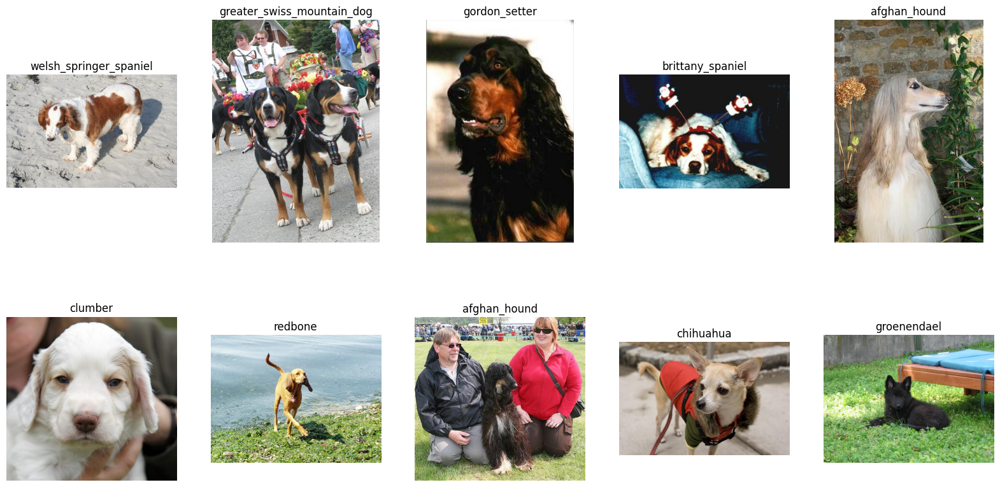

In [ ]:
# Plot 10 random images from the train_image_paths
plot_10_random_images_from_path_list(path_list=train_image_paths,
                                     extract_title=False) # don't need to extract the title since the image directories are already named simply

### TK - Make a 10% training dataset

UPTOHERE

* TK image - make an image diagram of the image split folder we're going to make e.g. train_10_percent...
* Why make this folder? (quicker experiments, faster to see if something works before scaling things up)

* Can copy a random 10% of the training images into a new folder
* Try to train a model on a smaller amount of data

In [ ]:
# TK - get the train file paths
# Get a random 10% of them
# Copy them to a target directory, e.g. train_dir_10_percent

# Create train_10_percent directory
train_10_percent_dir = images_split_dir / "train_10_percent"
train_10_percent_dir.mkdir(parents=True, exist_ok=True)

import random
random.seed(42)

train_image_paths_random_10_percent = random.sample(population=train_image_paths,
                                                    k=int(0.1*len(train_image_paths)))
len(train_image_paths_random_10_percent)

for path in tqdm(train_image_paths_random_10_percent):
  source_file_path = path
  destination_file_path = train_10_percent_dir / Path(*path.parts[-2:])

  print(destination_file_path.parent)
  # If the target directory doesn't exist, make it
  target_class_dir = destination_file_path.parent
  if not target_class_dir.is_dir():
    print(f"Making directory: {target_class_dir}")
    target_class_dir.mkdir(parents=True,
                           exist_ok=True)

  print(f"Copying: {source_file_path} to {destination_file_path}")
  copy2(src=source_file_path,
        dst=destination_file_path)

  0%|          | 0/1200 [00:00<?, ?it/s]

images_split/train_10_percent/clumber
Making directory: images_split/train_10_percent/clumber
Copying: images_split/train/clumber/n02101556_7528.jpg to images_split/train_10_percent/clumber/n02101556_7528.jpg
images_split/train_10_percent/komondor
Making directory: images_split/train_10_percent/komondor
Copying: images_split/train/komondor/n02105505_1406.jpg to images_split/train_10_percent/komondor/n02105505_1406.jpg
images_split/train_10_percent/newfoundland
Making directory: images_split/train_10_percent/newfoundland
Copying: images_split/train/newfoundland/n02111277_10160.jpg to images_split/train_10_percent/newfoundland/n02111277_10160.jpg
images_split/train_10_percent/afghan_hound
Making directory: images_split/train_10_percent/afghan_hound
Copying: images_split/train/afghan_hound/n02088094_4049.jpg to images_split/train_10_percent/afghan_hound/n02088094_4049.jpg
images_split/train_10_percent/briard
Making directory: images_split/train_10_percent/briard
Copying: images_split/trai

In [ ]:
# Count images in train_10_percent_dir
train_10_percent_image_class_counts = count_images_in_subdirs(train_10_percent_dir)
train_10_percent_image_class_counts_df = pd.DataFrame(train_10_percent_image_class_counts).sort_values("image_count", ascending=True)
train_10_percent_image_class_counts_df

,class_name,image_count
33,doberman,3
23,pembroke,4
61,brabancon_griffon,4
64,old_english_sheepdog,4
100,scotch_terrier,5
...,...,...
40,briard,16
88,collie,16
11,greater_swiss_mountain_dog,17
43,cocker_spaniel,18


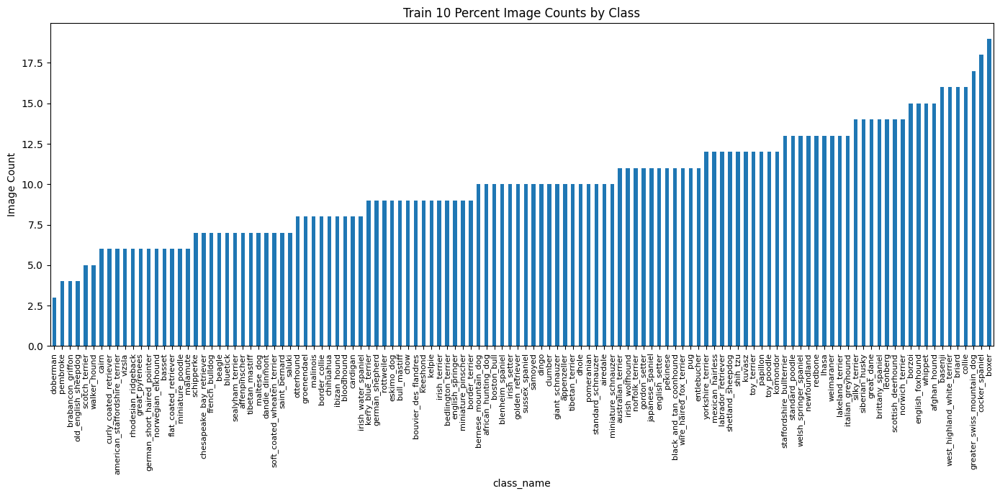

In [ ]:
# TK - turn the DataFrame above into a graph
plt.figure(figsize=(14, 7))
train_10_percent_image_class_counts_df.plot(kind="bar",
                     x="class_name",
                     y="image_count",
                     legend=False,
                     ax=plt.gca()) # plt.gca() = "get current axis", get the plt we setup above and put the data there

# Add customization
plt.title("Train 10 Percent Image Counts by Class")
plt.ylabel("Image Count")
plt.xticks(rotation=90, # Rotate the x labels for better visibility
           fontsize=8) # Make the font size smaller for easier reading
plt.tight_layout() # Ensure things fit nicely
plt.show()

## TK - Turn datasets into TensorFlow Dataset(s)

* See here: https://www.tensorflow.org/api_docs/python/tf/keras/utils/image_dataset_from_directory
* Also here: https://www.tensorflow.org/tutorials/load_data/images


> **Note:** TK - If you're working with similar styles of data (e.g. all dog photos), it's best practice to shuffle training datasets to prevent the model from learning any order in the data, no need to shuffle testing datasets (this makes for easier evaluation).

In [ ]:
import tensorflow as tf

img_size = 224
batch_size = 32

train_10_percent_ds = tf.keras.utils.image_dataset_from_directory(
    directory=train_10_percent_dir,
    batch_size=32,
    image_size=(img_size, img_size),
    shuffle=True,
    seed=42
)

train_ds = tf.keras.utils.image_dataset_from_directory(
    directory=train_dir,
    batch_size=32,
    image_size=(img_size, img_size),
    shuffle=True,
    seed=42
)

test_ds = tf.keras.utils.image_dataset_from_directory(
    directory=test_dir,
    batch_size=32,
    image_size=(img_size, img_size),
    shuffle=False,
    seed=42
)

Found 1200 files belonging to 120 classes.
Found 12000 files belonging to 120 classes.
Found 8580 files belonging to 120 classes.


In [ ]:
assert set(train_10_percent_ds.class_names) == set(train_ds.class_names) == set(test_ds.class_names)

In [ ]:
class_names = train_ds.class_names
class_names[:5]

['affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier']

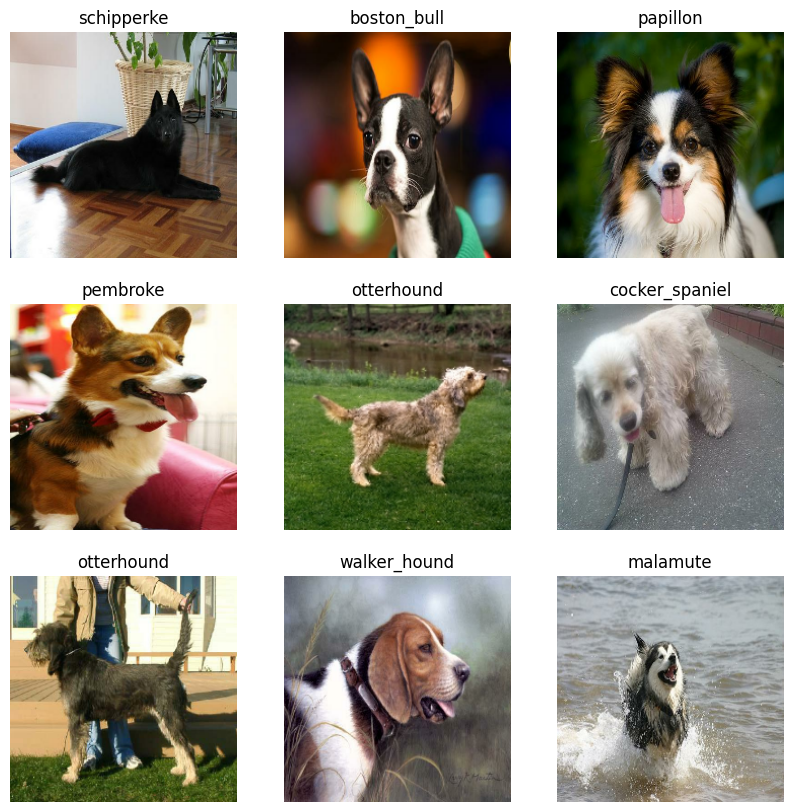

In [ ]:
import matplotlib.pyplot as plt

# TK - change this to a similar version of the above plotting function
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [ ]:
# TK - what does a single image look like?
image_batch, label_batch = next(iter(train_ds))
image_batch.shape, label_batch.shape

(TensorShape([32, 224, 224, 3]), TensorShape([32]))

In [ ]:
image_batch[0], label_batch[0], class_names[label_batch[0]]

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[ 95.33705 , 149.33705 , 213.33705 ],
         [ 95.33705 , 149.33705 , 213.33705 ],
         [ 95.33705 , 149.33705 , 213.33705 ],
         ...,
         [102.33705 , 154.33705 , 214.33705 ],
         [102.33705 , 152.33705 , 213.33705 ],
         [102.33705 , 152.33705 , 213.33705 ]],
 
        [[ 96.      , 150.      , 214.      ],
         [ 96.      , 150.      , 214.      ],
         [ 96.      , 150.      , 214.      ],
         ...,
         [103.      , 155.      , 215.      ],
         [103.      , 153.      , 214.      ],
         [103.      , 153.      , 214.      ]],
 
        [[ 96.685265, 150.68527 , 214.68527 ],
         [ 96.685265, 150.68527 , 214.68527 ],
         [ 96.685265, 150.68527 , 214.68527 ],
         ...,
         [103.685265, 155.68527 , 215.68527 ],
         [103.685265, 153.68527 , 214.68527 ],
         [103.685265, 153.68527 , 214.68527 ]],
 
        ...,
 
        [[ 98.23341 , 113.76687 

### TK - Configure the dataset for performance

* See here: https://www.tensorflow.org/guide/data_performance

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

# Shuffle training datasets but don't need to shuffle test datasets (for easier evaluation)
train_10_percent_ds = train_10_percent_ds.cache().shuffle(100).prefetch(buffer_size=AUTOTUNE)
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.cache().prefetch(buffer_size=AUTOTUNE)

## TK - Create model

### TK - Try transfer learning

* Only want to train the last layer of the model...
* See here: https://keras.io/guides/transfer_learning/

In [ ]:
num_classes = len(class_names)

In [ ]:
base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(
    include_top=False,
    weights="imagenet",
    input_shape=(img_size, img_size, 3),
    include_preprocessing=True
)

# base_model.summary()

# Freeze the base model
base_model.trainable = False
base_model.trainable

24274472/24274472 [==============================] - 1s 0us/step


False

In [ ]:
# TK - functionize this model creation step

# Create new model
inputs = tf.keras.Input(shape=(224, 224, 3))

# TK - Create data augmentation
# x = data_augmentation(inputs)

# Craft model
x = base_model(inputs, training=False)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = tf.keras.layers.Dense(units=num_classes,
                                activation="softmax", # TK - which activation function should you use?
                                name="output_layer")(x)
model_0 = tf.keras.Model(inputs, outputs, name="model_0")
model_0.summary()

Model: "model_0"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetv2-b0 (Functio  (None, 7, 7, 1280)        5919312   
 nal)                                                            
                                                                 
 global_average_pooling2d (  (None, 1280)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dropout (Dropout)           (None, 1280)              0         
                                                                 
 output_layer (Dense)        (None, 120)               153720    
                                                                 
Total params: 6073032 (23.17 MB)
Trainable params: 153720 (

In [ ]:
# Functionize model creation
from typing import Tuple

def create_model(include_top: bool = False,
                 num_classes: int = 1000,
                 input_shape: Tuple[int, int, int] = (224, 224, 3),
                 include_preprocessing: bool = True,
                 trainable: bool = False,
                 dropout: float = 0.2,
                 model_name: str = "model") -> tf.keras.Model:
  """
  Create an EfficientNetV2 B0 feature extractor model with a custom classifier layer.

  Args:
      include_top (bool, optional): Whether to include the top (classifier) layers of the model.
      num_classes (int, optional): Number of output classes for the classifier layer.
      input_shape (Tuple[int, int, int], optional): Input shape for the model's images (height, width, channels).
      include_preprocessing (bool, optional): Whether to include preprocessing layers for image normalization.
      trainable (bool, optional): Whether to make the base model trainable.
      dropout (float, optional): Dropout rate for the global average pooling layer.
      model_name (str, optional): Name for the created model.

  Returns:
      tf.keras.Model: A TensorFlow Keras model with the specified configuration.
  """
  # Create base model
  base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(
    include_top=include_top,
    weights="imagenet",
    input_shape=input_shape,
    include_preprocessing=include_preprocessing
  )

  # Freeze the base model (if necessary)
  base_model.trainable = trainable

  # Create input layer
  inputs = tf.keras.Input(shape=input_shape, name="input_layer")

  # Create model backbone
  x = base_model(inputs, training=trainable)
  x = tf.keras.layers.GlobalAveragePooling2D()(x)
  x = tf.keras.layers.Dropout(0.2)(x)

  # Create output layer (also known as "classifier" layer)
  outputs = tf.keras.layers.Dense(units=num_classes,
                                  activation="softmax",
                                  name="output_layer")(x)

  # Connect input and output layer
  model = tf.keras.Model(inputs,
                         outputs,
                         name=model_name)

  return model

model_0 = create_model(num_classes=len(class_names))
model_0.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetv2-b0 (Functio  (None, 7, 7, 1280)        5919312   
 nal)                                                            
                                                                 
 global_average_pooling2d_1  (None, 1280)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dropout_1 (Dropout)         (None, 1280)              0         
                                                                 
 output_layer (Dense)        (None, 120)               153720    
                                                                 
Total params: 6073032 (23.17 MB)
Trainable params: 153720 (60

## TK - Model 0 - Train a model on 10% of the training data

* TK - turn this into a table
* TK - add docs for compile + fit + evaluate + predict

A note on losses:
* If your labels are integers (e.g. `[[1], [23], [43], [16]...]`), use [`tf.keras.losses.SparseCategoricalCrossentropy()`](https://www.tensorflow.org/api_docs/python/tf/keras/losses/SparseCategoricalCrossentropy)
* If your labels are one-hot encoded (e.g. `[0, 1, 0, 0, 1, 0...]`), use [`tf.keras.losses.CategoricalCrossEntropy()`](https://www.tensorflow.org/api_docs/python/tf/keras/losses/CategoricalCrossentropy)

In [ ]:
# Create model
model_0 = create_model(num_classes=len(class_names),
                       model_name="model_0")

# Compile model
model_0.compile(optimizer="adam", # or can use tf.keras.optimizers.Adam()
                # Set from_logits=True if the last layer of your net is a Dense layer with no activation
                loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
                metrics=["accuracy"],
                steps_per_execution="auto")# new in TensorFlow 2.14.0

# Fit model
epochs=5
history_0 = model_0.fit(
  train_10_percent_ds,
  validation_data=test_ds,
  epochs=epochs)

Epoch 1/5
38/38 [==============================] - 25s 259ms/step - loss: 4.1107 - accuracy: 0.2150 - val_loss: 3.2047 - val_accuracy: 0.5185
Epoch 2/5
38/38 [==============================] - 7s 184ms/step - loss: 2.3102 - accuracy: 0.7217 - val_loss: 2.0488 - val_accuracy: 0.6721
Epoch 3/5
38/38 [==============================] - 7s 184ms/step - loss: 1.2899 - accuracy: 0.8500 - val_loss: 1.4266 - val_accuracy: 0.7488
Epoch 4/5
38/38 [==============================] - 7s 181ms/step - loss: 0.7874 - accuracy: 0.9158 - val_loss: 1.1094 - val_accuracy: 0.7873
Epoch 5/5
38/38 [==============================] - 7s 180ms/step - loss: 0.5392 - accuracy: 0.9467 - val_loss: 0.9386 - val_accuracy: 0.8014


### TK - Evaluate Model 0 on the test data

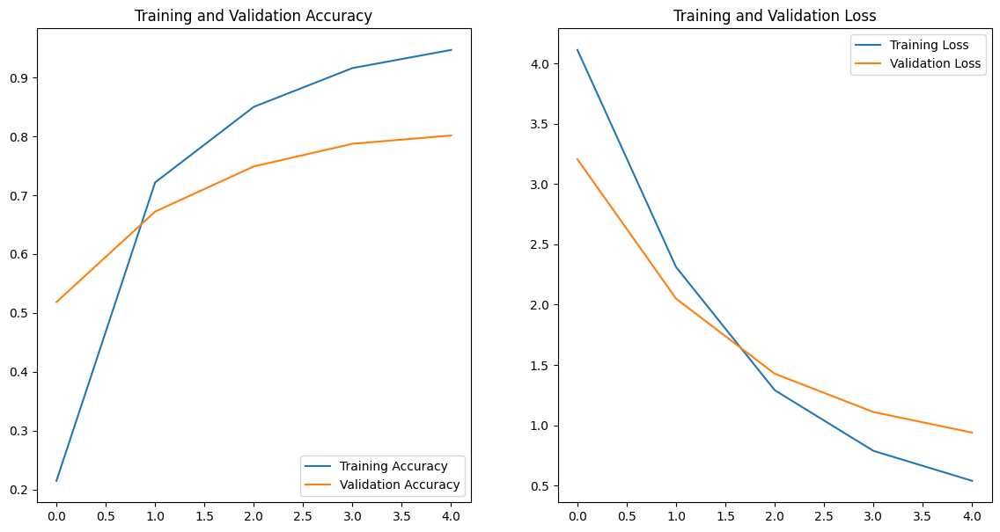

In [ ]:
def plot_model_loss_curves(history):
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']

  loss = history.history['loss']
  val_loss = history.history['val_loss']

  epochs_range = range(epochs)

  plt.figure(figsize=(14, 7))
  plt.subplot(1, 2, 1)
  plt.plot(epochs_range, acc, label='Training Accuracy')
  plt.plot(epochs_range, val_acc, label='Validation Accuracy')
  plt.legend(loc='lower right')
  plt.title('Training and Validation Accuracy')

  plt.subplot(1, 2, 2)
  plt.plot(epochs_range, loss, label='Training Loss')
  plt.plot(epochs_range, val_loss, label='Validation Loss')
  plt.legend(loc='upper right')
  plt.title('Training and Validation Loss')
  plt.show()

plot_model_loss_curves(history=history_0)

In [ ]:
# Evaluate model_0, see: https://www.tensorflow.org/api_docs/python/tf/keras/Model#evaluate
model_0_results = model_0.evaluate(test_ds)

269/269 [==============================] - 6s 23ms/step - loss: 0.9386 - accuracy: 0.8014


## TK - Model 1 - Train a model on 100% of the training data

Repeat the process for the above and compare the results

In [ ]:
model_1 = create_model(num_classes=len(class_names),
                       model_name="model_1")
model_1.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetv2-b0 (Functio  (None, 7, 7, 1280)        5919312   
 nal)                                                            
                                                                 
 global_average_pooling2d_3  (None, 1280)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dropout_3 (Dropout)         (None, 1280)              0         
                                                                 
 output_layer (Dense)        (None, 120)               153720    
                                                                 
Total params: 6073032 (23.17 MB)
Trainable params: 153720 (

In [ ]:
# Compile the model
model_1.compile(optimizer="adam",
                loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False), # if no activation function at end of model, use "from_logits=True"
                metrics=["accuracy"])

# Train the model
tf.keras.utils.set_random_seed(42)
history_1 = model_1.fit(train_ds,
                        epochs=epochs,
                        validation_data=test_ds)

Epoch 1/5
375/375 [==============================] - 27s 44ms/step - loss: 1.3750 - accuracy: 0.7448 - val_loss: 0.5082 - val_accuracy: 0.8716
Epoch 2/5
375/375 [==============================] - 15s 41ms/step - loss: 0.4004 - accuracy: 0.8932 - val_loss: 0.4060 - val_accuracy: 0.8809
Epoch 3/5
375/375 [==============================] - 15s 41ms/step - loss: 0.2884 - accuracy: 0.9206 - val_loss: 0.3812 - val_accuracy: 0.8817
Epoch 4/5
375/375 [==============================] - 15s 40ms/step - loss: 0.2308 - accuracy: 0.9369 - val_loss: 0.3724 - val_accuracy: 0.8841
Epoch 5/5
375/375 [==============================] - 15s 39ms/step - loss: 0.1896 - accuracy: 0.9482 - val_loss: 0.3617 - val_accuracy: 0.8829


TK - How many epochs should I fit for? ... generally with transfer learning you can get pretty good results quite quickly, however, you may want to look into training for longer, e.g. more epochs, fine-tuning the whole model and using callbacks such as Early Stopping to prevent the model from training for too long

### TK - Evaluate Model 1 on the test data

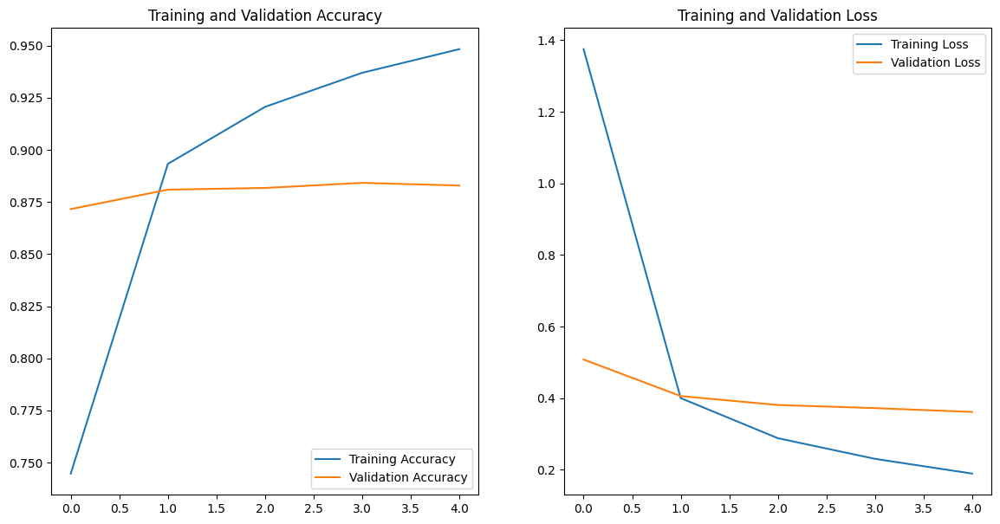

In [ ]:
plot_model_loss_curves(history=history_1)

In [ ]:
# Evaluate model_1
model_1_results = model_1.evaluate(test_ds)

269/269 [==============================] - 6s 23ms/step - loss: 0.3617 - accuracy: 0.8829


## TK - Make and evaluate predictions of the best model

In [ ]:
# This will output logits (as long as softmax activation isn't in the model)
test_preds = model_1.predict(test_ds)

# Note: If not using activation="softmax" in last layer of model, may need to turn them into prediction probabilities (easier to understand)
# test_preds = tf.keras.activations.softmax(tf.constant(test_preds), axis=-1)

269/269 [==============================] - 7s 21ms/step


In [ ]:
test_preds.shape

(8580, 120)

In [ ]:
test_preds[0].shape, tf.argmax(test_preds[0])

((120,), <tf.Tensor: shape=(), dtype=int64, numpy=0>)

In [ ]:
import numpy as np
test_ds_images = np.concatenate([images for images, labels in test_ds], axis=0)
test_ds_labels = np.concatenate([labels for images, labels in test_ds], axis=0)
test_ds_labels[0], test_ds_images[0]

(0,
 array([[[ 43.804947,  44.804947,  38.804947],
         [ 39.12483 ,  40.12483 ,  34.12483 ],
         [ 82.701065,  83.701065,  77.62723 ],
         ...,
         [ 21.578135,  25.578135,  24.578135],
         [ 19.741274,  23.741274,  22.741274],
         [ 15.660867,  19.660868,  18.660868]],
 
        [[ 40.762886,  41.762886,  35.41467 ],
         [ 38.87469 ,  39.87469 ,  33.526478],
         [ 84.99161 ,  85.99161 ,  78.59259 ],
         ...,
         [ 20.462063,  24.462063,  23.462063],
         [ 19.207607,  23.207607,  22.207607],
         [ 18.408989,  22.408989,  21.408989]],
 
        [[ 37.69817 ,  38.69817 ,  30.698172],
         [ 42.096752,  43.096752,  35.096752],
         [ 93.62746 ,  94.81206 ,  86.258255],
         ...,
         [ 19.530594,  23.530594,  22.530594],
         [ 18.091536,  22.091536,  21.091536],
         [ 19.202106,  23.202106,  22.202106]],
 
        ...,
 
        [[106.28673 ,  70.28673 ,  96.28673 ],
         [105.43164 ,  69.43164 ,  95

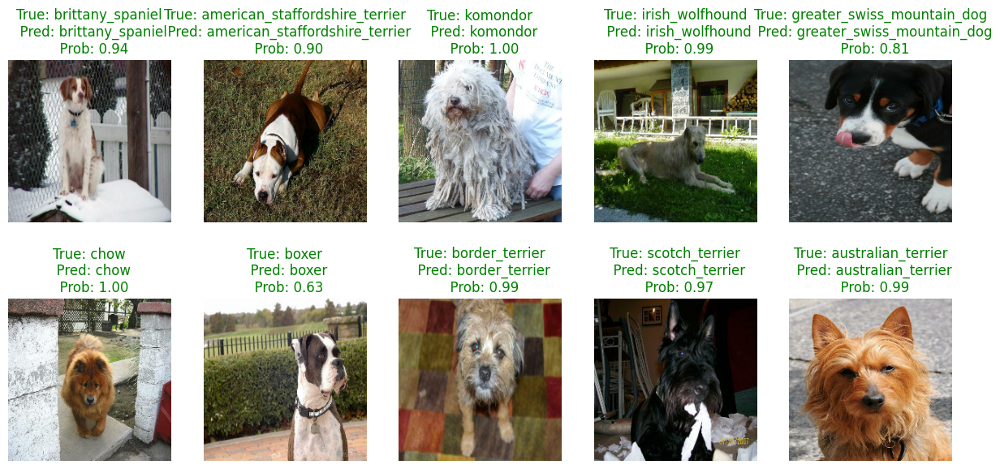

In [ ]:
# Choose a random 10 indexes from the test data and compare the values
import random

random_indexes = random.sample(range(len(test_ds_images)), 10)

# TK - this is why we don't shuffle the test data
fig, axes = plt.subplots(2, 5, figsize=(15, 7))
for i, ax in enumerate(axes.flatten()):
  target_index = random_indexes[i]

  # Get relevant target image, label, prediction and prediction probabilities
  test_image = test_ds_images[target_index]
  test_image_truth_label = class_names[test_ds_labels[target_index]]
  test_image_pred_probs = test_preds[target_index]
  test_image_pred_class = class_names[tf.argmax(test_image_pred_probs)]

  # Plot the image
  ax.imshow(test_image.astype("uint8"))

  # Create sample title
  title = f"""True: {test_image_truth_label}
  Pred: {test_image_pred_class}
  Prob: {np.max(test_image_pred_probs):.2f}"""

  # Colour the title based on correctness of pred
  ax.set_title(title,
               color="green" if test_image_truth_label == test_image_pred_class else "red")
  ax.axis("off")

### TK - Accuracy per class

In [ ]:
# TK - get accuracy values per class and show how they compare to the original results
# see: http://vision.stanford.edu/aditya86/ImageNetDogs/ -> http://vision.stanford.edu/aditya86/ImageNetDogs/bar_graph_full.png

# Want to compare test_preds + test_labels on a per class basis
# Can I convert both of these into a DataFrame and see what happens?
test_preds_labels = test_preds.argmax(axis=-1)
test_preds_labels

array([  0,   0,   0, ..., 102, 119, 119])

In [ ]:
test_ds_labels

array([  0,   0,   0, ..., 119, 119, 119], dtype=int32)

In [ ]:
test_results_df = pd.DataFrame({"test_pred_label": test_preds_labels,
                                "test_pred_prob": np.max(test_preds, axis=-1),
                                "test_pred_class_name": [class_names[test_pred_label] for test_pred_label in test_preds_labels],
                                "test_truth_label": test_ds_labels,
                                "test_truth_class_name": [class_names[test_truth_label] for test_truth_label in test_ds_labels]})

test_results_df["correct"] = (test_results_df["test_pred_class_name"] == test_results_df["test_truth_class_name"]).astype(int)
test_results_df

,test_pred_label,test_pred_prob,test_pred_class_name,test_truth_label,test_truth_class_name,correct
0,0,0.981926,affenpinscher,0,affenpinscher,1
1,0,0.747863,affenpinscher,0,affenpinscher,1
2,0,0.995609,affenpinscher,0,affenpinscher,1
3,44,0.467855,flat_coated_retriever,0,affenpinscher,0
4,0,0.997168,affenpinscher,0,affenpinscher,1
...,...,...,...,...,...,...
8575,119,0.785783,yorkshire_terrier,119,yorkshire_terrier,1
8576,102,0.735301,silky_terrier,119,yorkshire_terrier,0
8577,102,0.828518,silky_terrier,119,yorkshire_terrier,0
8578,119,0.940582,yorkshire_terrier,119,yorkshire_terrier,1


In [ ]:
# Calculate accuracy per class
accuracy_per_class = test_results_df.groupby("test_truth_class_name")["correct"].mean()
accuracy_per_class_df = pd.DataFrame(accuracy_per_class).reset_index().sort_values("correct", ascending=False)
accuracy_per_class_df
# pd.DataFrame(accuracy_per_class).sort_values("correct", ascending=False)

,test_truth_class_name,correct
62,keeshond,1.000000
10,bedlington_terrier,1.000000
30,chow,0.989583
92,saint_bernard,0.985714
2,african_hunting_dog,0.985507
...,...,...
76,miniature_poodle,0.600000
5,appenzeller,0.588235
104,staffordshire_bullterrier,0.581818
16,border_collie,0.560000


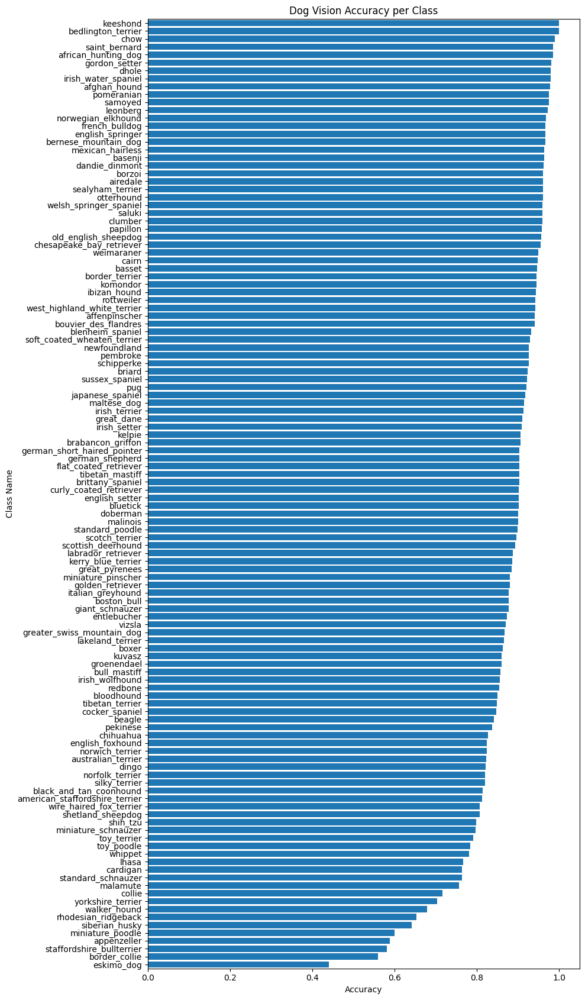

In [ ]:
# Let's create a horizontal bar chart to replicate a similar plot to the original Stanford Dogs page
plt.figure(figsize=(10, 17))
plt.barh(y=accuracy_per_class_df["test_truth_class_name"],
         width=accuracy_per_class_df["correct"])
plt.xlabel("Accuracy")
plt.ylabel("Class Name")
plt.title("Dog Vision Accuracy per Class")
plt.ylim(-0.5, len(accuracy_per_class_df["test_truth_class_name"]) - 0.5)  # Adjust y-axis limits to reduce white space
plt.gca().invert_yaxis()  # This will display the first class at the top
plt.tight_layout()
plt.show()

TK - How does this compare to the original results?

### TK - Finding the most wrong examples

In [ ]:
# Get most wrong
top_100_most_wrong = test_results_df[test_results_df["correct"] == 0].sort_values("test_pred_prob", ascending=False)[:100]
top_100_most_wrong

,test_pred_label,test_pred_prob,test_pred_class_name,test_truth_label,test_truth_class_name,correct
2727,75,0.993720,miniature_pinscher,38,doberman,0
6884,54,0.993490,groenendael,95,schipperke,0
5480,44,0.990781,flat_coated_retriever,78,newfoundland,0
7630,4,0.988580,american_staffordshire_terrier,104,staffordshire_bullterrier,0
4155,55,0.986820,ibizan_hound,60,italian_greyhound,0
...,...,...,...,...,...,...
2644,63,0.882950,kelpie,37,dingo,0
7934,73,0.882824,maltese_dog,109,tibetan_terrier,0
1059,14,0.881923,bloodhound,12,black_and_tan_coonhound,0
2047,86,0.879732,pembroke,27,cardigan,0


In [ ]:
top_100_most_wrong.sample(n=10).index

7804

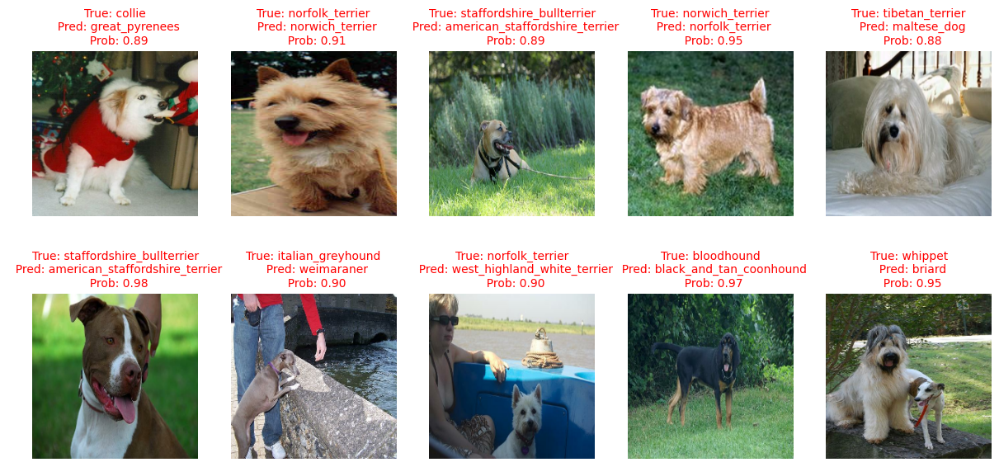

In [ ]:
# Choose a random 10 indexes from the test data and compare the values
import random

random_most_wrong_indexes = top_100_most_wrong.sample(n=10).index

# TK - this is why we don't shuffle the test data
fig, axes = plt.subplots(2, 5, figsize=(15, 7))
for i, ax in enumerate(axes.flatten()):
  target_index = random_most_wrong_indexes[i]

  # Get relevant target image, label, prediction and prediction probabilities
  test_image = test_ds_images[target_index]
  test_image_truth_label = class_names[test_ds_labels[target_index]]
  test_image_pred_probs = test_preds[target_index]
  test_image_pred_class = class_names[tf.argmax(test_image_pred_probs)]

  # Plot the image
  ax.imshow(test_image.astype("uint8"))

  # Create sample title
  title = f"""True: {test_image_truth_label}
  Pred: {test_image_pred_class}
  Prob: {np.max(test_image_pred_probs):.2f}"""

  # Colour the title based on correctness of pred
  ax.set_title(title,
               color="green" if test_image_truth_label == test_image_pred_class else "red",
               fontsize=10)
  ax.axis("off")

### TK - Create a confusion matrix

TK see docs: https://scikit-learn.org/stable/modules/generated/sklearn.metrics.ConfusionMatrixDisplay.html#sklearn-metrics-confusionmatrixdisplay

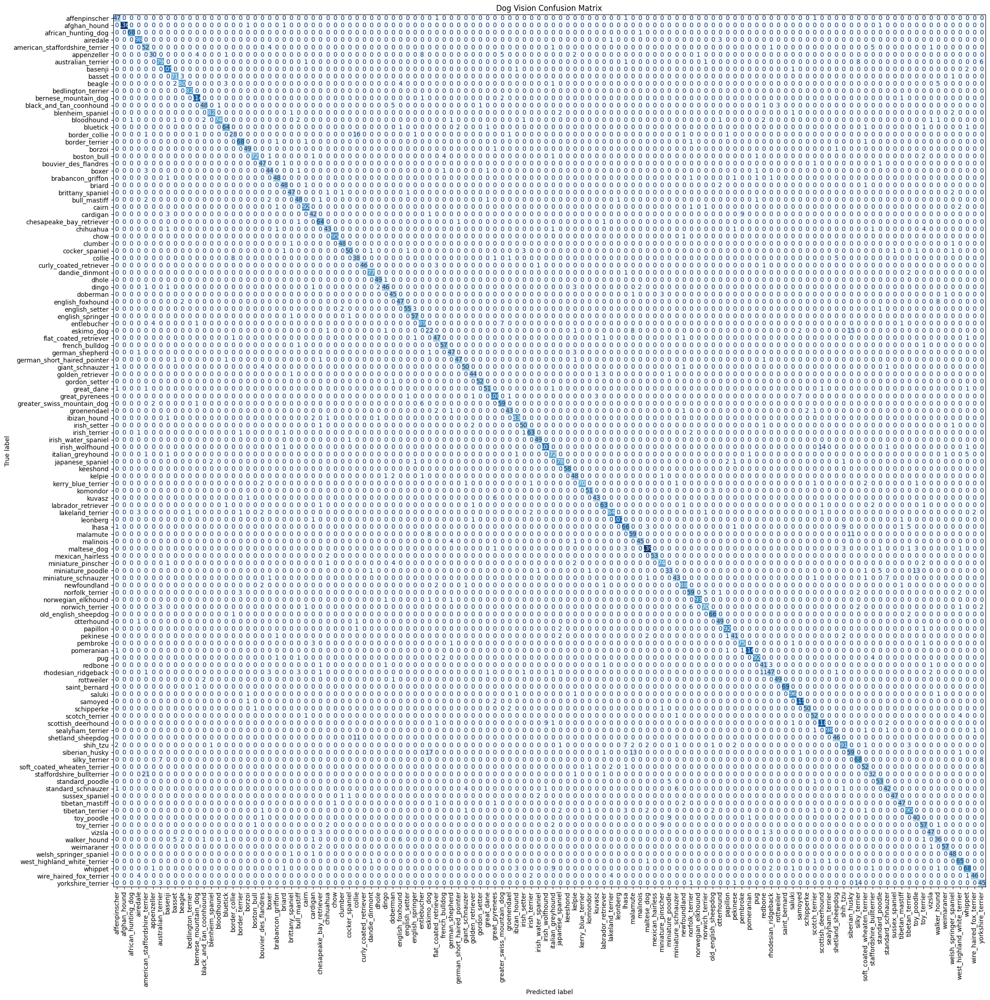

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

fig, ax = plt.subplots(figsize=(25, 25))
confusion_matrix_dog_preds = confusion_matrix(y_true=test_ds_labels,
                                              y_pred=test_preds_labels)

confusion_matrix_display = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix_dog_preds,
                                                  display_labels=class_names)

# See: https://scikit-learn.org/stable/modules/generated/sklearn.metrics.ConfusionMatrixDisplay.html#sklearn.metrics.ConfusionMatrixDisplay.plot
ax.set_title("Dog Vision Confusion Matrix")
confusion_matrix_display.plot(xticks_rotation="vertical",
                              cmap="Blues",
                              colorbar=False,
                              ax=ax);

## TK - Save and load the best model

See here: https://www.tensorflow.org/tutorials/keras/save_and_load#new_high-level_keras_format

> TK **Note:** You may also see the "SavedModel" format as well as ".hdf5" formats...

In [ ]:
# Save the model to .keras
model_1.save("dog_vision_model.keras")

In [ ]:
# Load the model
loaded_model = tf.keras.models.load_model("dog_vision_model.keras")

# Evaluate the loaded model
loaded_model_results = loaded_model.evaluate(test_ds)

269/269 [==============================] - 10s 26ms/step - loss: 0.3711 - accuracy: 0.8787


In [ ]:
assert model_1_results == loaded_model_results

## TK - Make predictions on custom images with the best model

In [ ]:
# TK - load custom image(s)
!wget -nc https://github.com/mrdbourke/zero-to-mastery-ml/raw/master/images/dog-photos.zip
!unzip dog-photos.zip

--2023-10-26 03:02:51--  https://github.com/mrdbourke/zero-to-mastery-ml/raw/master/images/dog-photos.zip
Resolving github.com (github.com)... 140.82.121.4
Connecting to github.com (github.com)|140.82.121.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/mrdbourke/zero-to-mastery-ml/master/images/dog-photos.zip [following]
--2023-10-26 03:02:51--  https://raw.githubusercontent.com/mrdbourke/zero-to-mastery-ml/master/images/dog-photos.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1091355 (1.0M) [application/zip]
Saving to: ‘dog-photos.zip’

dog-photos.zip      100%[===================>]   1.04M  --.-KB/s    in 0.02s   

2023-10-26 03:02:52 (51.5 MB/s) - ‘dog-photos.zip’ saved [1091355/1091

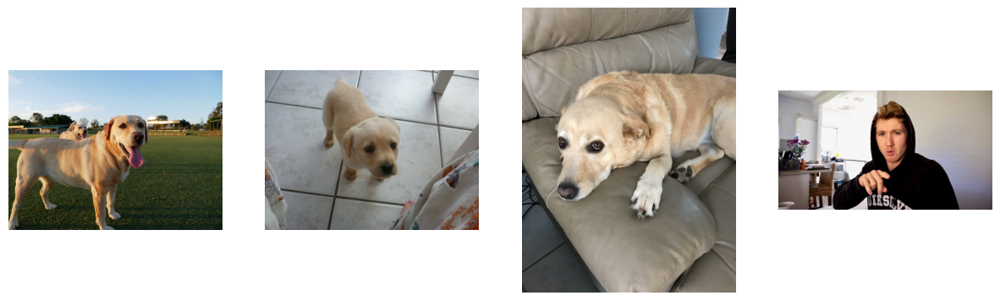

In [ ]:
# View images
custom_image_paths = ["dog-photo-1.jpeg",
                      "dog-photo-2.jpeg",
                      "dog-photo-3.jpeg",
                      "dog-photo-4.jpeg"]

fig, axes = plt.subplots(1, 4, figsize=(15, 7))
for i, ax in enumerate(axes.flatten()):
  ax.imshow(plt.imread(custom_image_paths[i]))
  ax.axis("off")

# def plot_10_random_images_from_path_list(path_list: list):
#     fig, axes = plt.subplots(2, 5, figsize=(20, 10))
#     samples = random.sample(path_list, 10)
#     for i, ax in enumerate(axes.flatten()):
#         sample_path = samples[i]
#         sample_title = sample_path.parent.stem
#         ax.imshow(plt.imread(sample_path))
#         ax.set_title(sample_title)
#         ax.axis("off")

In [ ]:
# This will error...
loaded_model.predict("dog-photo-1.jpeg")

IndexError: ignored

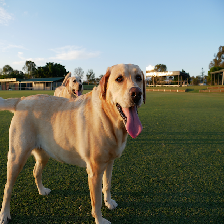

In [ ]:
# Model needs to make predictions on images in same format it was trained on

# Load the image (into PIL format)
custom_image = tf.keras.utils.load_img(
  path="dog-photo-1.jpeg",
  color_mode="rgb",
  target_size=(img_size, img_size),
)

custom_image

In [ ]:
# Turn the image into a tensor
custom_image_tensor = tf.keras.utils.img_to_array(custom_image)
custom_image_tensor.shape

(224, 224, 3)

In [ ]:
loaded_model.predict(custom_image_tensor)

ValueError: ignored

In [ ]:
pred_probs = loaded_model.predict(tf.expand_dims(custom_image_tensor, axis=0))
# pred_probs = tf.keras.activations.softmax(tf.constant(pred_probs)) # if you have no activation="softmax" in your model
class_names[tf.argmax(pred_probs, axis=-1).numpy()[0]]

1/1 [==============================] - 2s 2s/step


'labrador_retriever'

In [ ]:
tf.expand_dims(custom_image_tensor, axis=0).shape

TensorShape([1, 224, 224, 3])

> **Note:** TK - In the case of some models you may need to rescale your values here, in our case the Rescaling layer is built-in to the model.


In [ ]:
def pred_on_custom_image(image_path,
                         model,
                         target_size=img_size,
                         class_names=class_names,
                         plot=True):

  # Prepare and load image
  custom_image = tf.keras.utils.load_img(
    path=image_path,
    color_mode="rgb",
    target_size=(target_size, target_size),
  )

  # Turn the image into a tensor
  custom_image_tensor = tf.keras.utils.img_to_array(custom_image)

  # Add a batch dimension to the target tensor (e.g. (224, 224, 3) -> (1, 224, 224, 3))
  custom_image_tensor = tf.expand_dims(custom_image_tensor, axis=0)

  # Make a prediction with the target model
  pred_probs = model.predict(custom_image_tensor)
  # pred_probs = tf.keras.activations.softmax(tf.constant(pred_probs))
  pred_class = class_names[tf.argmax(pred_probs, axis=-1).numpy()[0]]

  # Plot if we want
  if not plot:
    return pred_class
  else:
    plt.figure(figsize=(5, 3))
    plt.imshow(plt.imread(image_path))
    plt.title(pred_class)
    plt.axis("off")

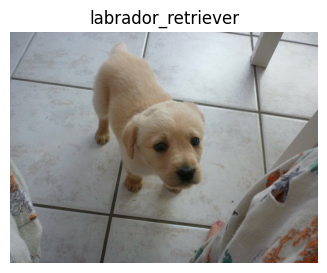

In [ ]:
pred_on_custom_image(image_path="dog-photo-2.jpeg", model=loaded_model)

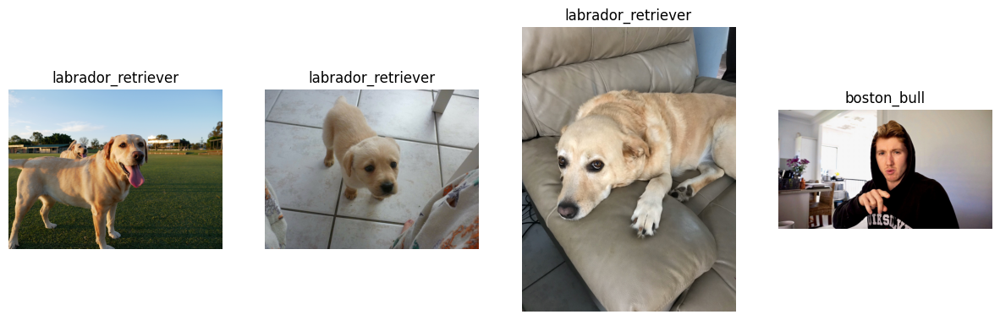

In [ ]:
# Predict on multiple images
fig, axes = plt.subplots(1, 4, figsize=(15, 7))
for i, ax in enumerate(axes.flatten()):
  image_path = custom_image_paths[i]
  pred_class = pred_on_custom_image(image_path=image_path,
                                    model=loaded_model,
                                    plot=False)
  ax.imshow(plt.imread(image_path))
  ax.set_title(pred_class)
  ax.axis("off")

## TK - Extensions & Exercises

* Create a machine learning app with Gradio to predict on images of dogs - https://www.gradio.app/
* Try a prediction on your own images of dogs and see if the model is correct
* Train a model on your own custom set of image classes, for example, apple vs banana vs orange
* More callbacks -
* Data augmentation -
* Other models - see tf.keras.applications or Kaggle Models
* ZTM TensorFlow course -
  * See further fine-tuning here
  * See videos on my YouTube for a more comprehensive TensorFlow overview to get started

### TK - Try data augmentation

See: https://www.tensorflow.org/tutorials/images/data_augmentation

In [ ]:
from tensorflow.keras import layers

data_augmentation = tf.keras.Sequential(
    [
        layers.RandomFlip("horizontal"),
        layers.RandomRotation(factor=0.2),
        layers.RandomZoom(
            height_factor=0.2, width_factor=0.2
        ),
    ],
    name="data_augmentation"
)

base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(
    include_top=False,
    weights='imagenet',
    input_shape=(img_size, img_size, 3),
    include_preprocessing=True
)

# base_model.summary()

# Freeze the base model
base_model.trainable = False

# TK - functionize this

# Create new model
inputs = tf.keras.Input(shape=(224, 224, 3))

# TK - Create data augmentation
x = data_augmentation(inputs)

# Craft model
x = base_model(x, training=False)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = tf.keras.layers.Dense(num_classes,
                                name="output_layer",
                                activation="softmax")(x) # Note: If you have "softmax" activation, use from_logits=False in loss function
model_2 = tf.keras.Model(inputs, outputs, name="model_2")
model_2.summary()